In [1]:
#%matplotlib agg
%tensorflow_version 1.x
import matplotlib
matplotlib.use('Agg')
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from tqdm.notebook import tqdm

from IPython.display import clear_output

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import gridspec

import hw4_utils
import hw4_mnist

# nicer color map for visualizing both positive and negative attributions
hot = cm.get_cmap('hot', 128)
cool = cm.get_cmap('cool', 128)
binary = cm.get_cmap('binary', 128)
hotcold = np.vstack((binary(np.linspace(0,1,128)) * cool(np.linspace(0, 1, 128)),
                     hot(np.linspace(0, 1, 128))))
hotcold_cmap = ListedColormap(hotcold, name='hotcold')

# for latex in matplotlib:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
## for Palatino and other serif fonts use:
#rc('font',**{'family':'serif','serif':['Palatino']})
#rc('text', usetex=True)

mnist_data = hw4_mnist.load_data()

TensorFlow 1.x selected.



In [2]:
m = hw4_mnist.MNISTModel()
#m._prepare_model() # retrain and save model
m.load()

In [32]:
for s in tqdm(mnist_data):
    preds = m.f_preds(s.X)
    print((preds == s.Y).mean())

0.97756
0.9783
0.981



# PART 1

In [0]:
import hw4_part1
hw4_part1.tqdm = tqdm

def show_attack(attacker, idxs, dat):  
    X = dat.X[idxs]
    Y = dat.Y[idxs]
    
    Xp = att.attack_batch(X, Y)

    for x, xp, yt, idx in list(zip(X, Xp, Y, idxs)):    
        y  = np.argmax(m.model.predict(x [np.newaxis, :, :, :])[0])
        yp = np.argmax(m.model.predict(xp[np.newaxis, :, :, :])[0])
    
        d = (x-xp).flatten()

        dnorms, dnorms_str = hw4_utils.norms(np.expand_dims(d, axis=0))
    
        lim = max(abs(np.min(d)), abs(np.max(d)))
        # make colorbar limits symmetric, with black being 0
    
        print(f"{yt}: {y} -> {yp} {dnorms_str}")

        fig = plt.figure(figsize=(6.5,3))
        gs = gridspec.GridSpec(1,3, width_ratios=[2,2,2])
        axs = [plt.subplot(gs[i]) for i in range(3)]
    
        fig.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.05, hspace=0)
    
        axs[0].set_axis_off()
        axs[1].set_axis_off()
        axs[2].set_axis_off()
    
        axs[0].imshow(x[:,:,0])
        axs[1].imshow(xp[:,:,0])
        c = axs[2].imshow((xp-x)[:,:,0], cmap=hotcold_cmap, vmin=-lim, vmax=lim)
        
        cax = fig.add_axes([axs[2].get_position().x1+0.01,
                            axs[2].get_position().y0,
                            0.1,
                            axs[2].get_position().y1 - axs[2].get_position().y0])
        
        fig.colorbar(mappable=c, cax=cax)
        
        fig.suptitle(f"instance={idx}, {y} $\\rightarrow$ {yp}, {dnorms_str}\n{str(att)}")
    
        display(fig)
        
    plt.close('all')

PGD Attack: No Target with Clipping


Written Exercise 3:

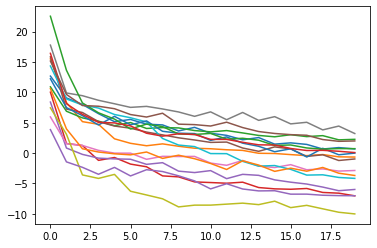

Success rate:  0.5625
Mean Distortion:  $L_0$=441.0000, $L_1$=67.1348, $L_2$=3.4731, $L_\infty$=0.2000


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


5: 5 -> 3 $L_0$=462.0000, $L_1$=66.1762, $L_2$=3.4338, $L_\infty$=0.2000


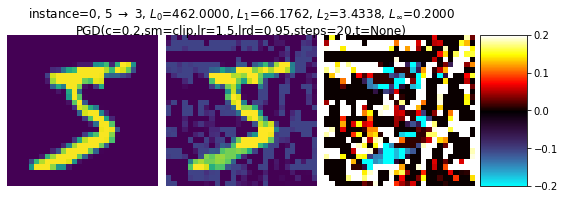

0: 0 -> 0 $L_0$=476.0000, $L_1$=75.9054, $L_2$=3.7506, $L_\infty$=0.2000


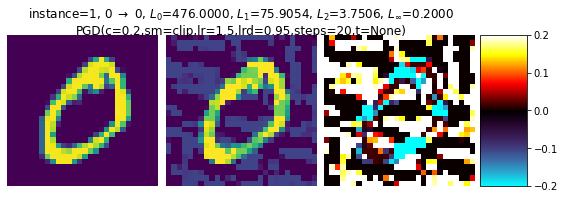

4: 4 -> 7 $L_0$=430.0000, $L_1$=66.4926, $L_2$=3.4542, $L_\infty$=0.2000


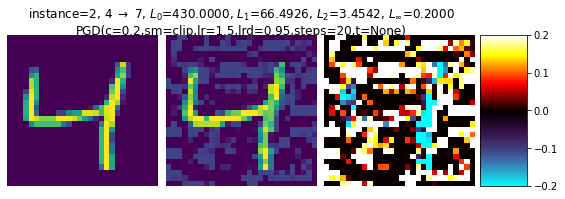

1: 1 -> 7 $L_0$=432.0000, $L_1$=70.7117, $L_2$=3.6116, $L_\infty$=0.2000


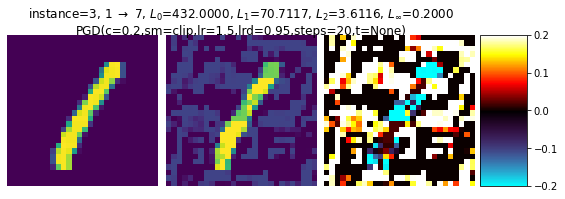

9: 9 -> 7 $L_0$=453.0000, $L_1$=69.8679, $L_2$=3.5586, $L_\infty$=0.2000


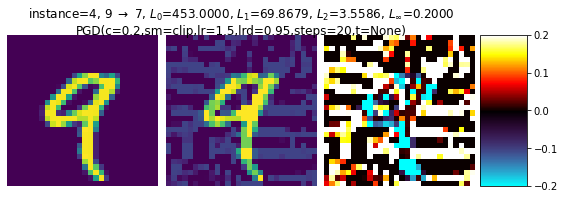

2: 2 -> 2 $L_0$=470.0000, $L_1$=70.4088, $L_2$=3.5618, $L_\infty$=0.2000


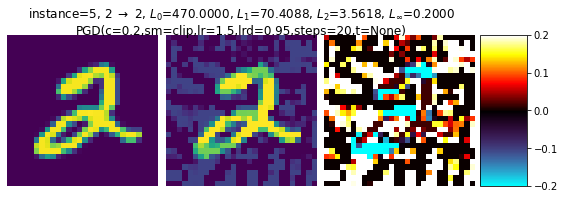

1: 1 -> 8 $L_0$=430.0000, $L_1$=64.0847, $L_2$=3.3856, $L_\infty$=0.2000


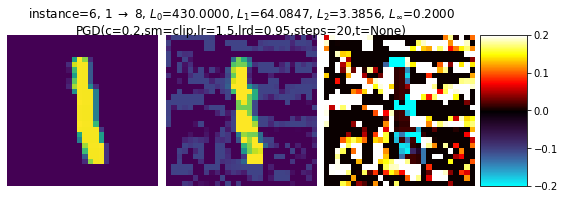

3: 3 -> 3 $L_0$=481.0000, $L_1$=67.3795, $L_2$=3.4495, $L_\infty$=0.2000


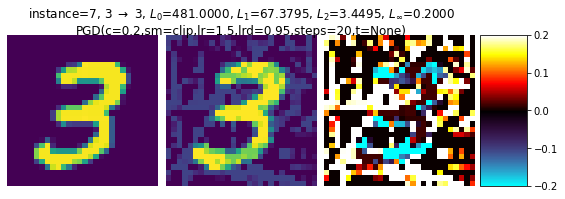

1: 1 -> 8 $L_0$=430.0000, $L_1$=66.5360, $L_2$=3.4635, $L_\infty$=0.2000


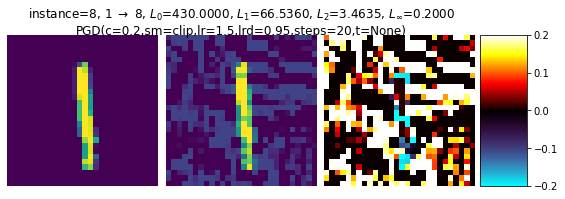

4: 4 -> 4 $L_0$=447.0000, $L_1$=70.5828, $L_2$=3.5906, $L_\infty$=0.2000


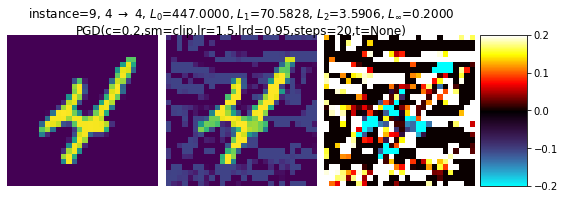

3: 3 -> 3 $L_0$=443.0000, $L_1$=64.3368, $L_2$=3.3999, $L_\infty$=0.2000


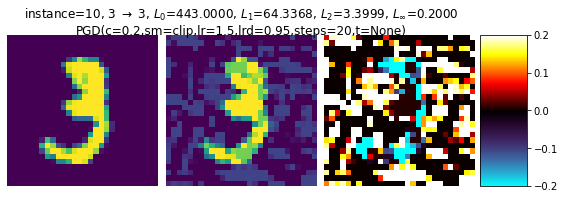

5: 5 -> 3 $L_0$=452.0000, $L_1$=69.9633, $L_2$=3.5351, $L_\infty$=0.2000


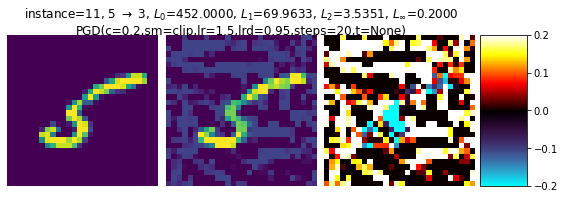

3: 3 -> 3 $L_0$=489.0000, $L_1$=75.0539, $L_2$=3.6918, $L_\infty$=0.2000


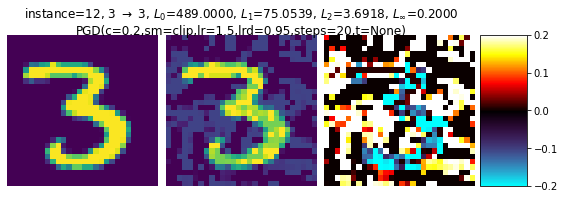

6: 6 -> 6 $L_0$=457.0000, $L_1$=69.8270, $L_2$=3.5498, $L_\infty$=0.2000


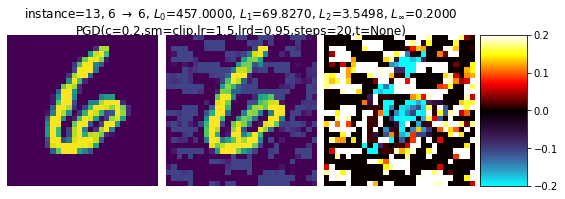

1: 1 -> 8 $L_0$=428.0000, $L_1$=64.0120, $L_2$=3.3640, $L_\infty$=0.2000


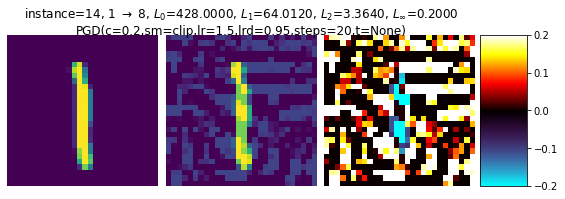

7: 7 -> 9 $L_0$=452.0000, $L_1$=66.3691, $L_2$=3.4514, $L_\infty$=0.2000


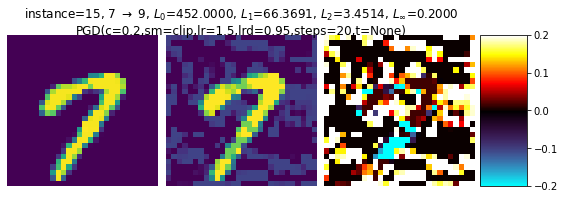

In [0]:
# evasion attack
att = hw4_part1.PGDAttacker(
    model=m,
    num_steps=20,
    target=None,
    learning_rate_decay=0.95,
    learning_rate=1.5,
    step_mode="clip",
    c=0.2
)
att.evaluate(
    X=mnist_data.train.X[0:16*1],
    Y=mnist_data.train.Y[0:16*1],
    display_progress=True
)
show_attack(att, np.arange(0, 16), mnist_data.train)

PGD Attack: No Target with Projection

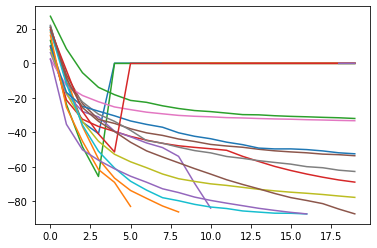

Success rate:  0.6875
Mean Distortion:  $L_0$=333.2727, $L_1$=278.2802, $L_2$=12.6129, $L_\infty$=1.0000


5: 5 -> 3 $L_0$=113.0000, $L_1$=35.5126, $L_2$=4.8630, $L_\infty$=1.0000


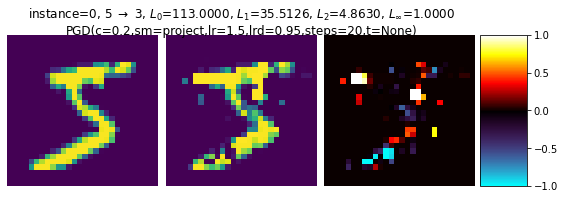

0: 0 -> 0 $L_0$=784.0000, $L_1$=662.5352, $L_2$=25.3786, $L_\infty$=1.0000


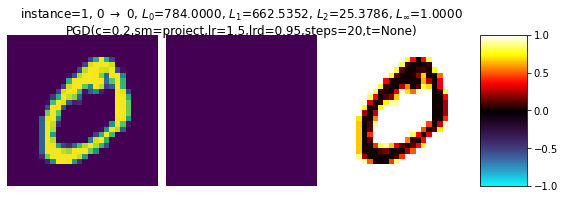

4: 4 -> 7 $L_0$=81.0000, $L_1$=36.4879, $L_2$=5.2931, $L_\infty$=1.0000


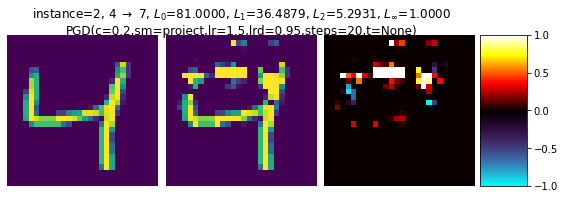

1: 1 -> 7 $L_0$=43.0000, $L_1$=20.3042, $L_2$=4.2028, $L_\infty$=1.0000


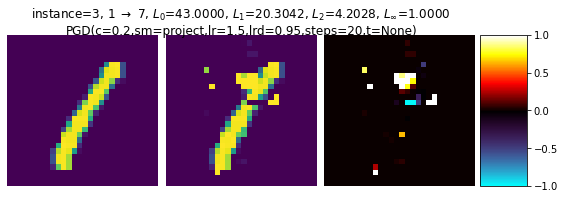

9: 9 -> 0 $L_0$=784.0000, $L_1$=693.3203, $L_2$=26.0633, $L_\infty$=1.0000


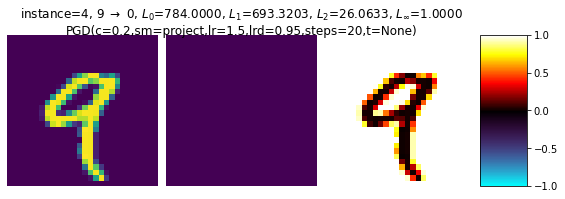

2: 2 -> 2 $L_0$=82.0000, $L_1$=28.3593, $L_2$=4.6769, $L_\infty$=1.0000


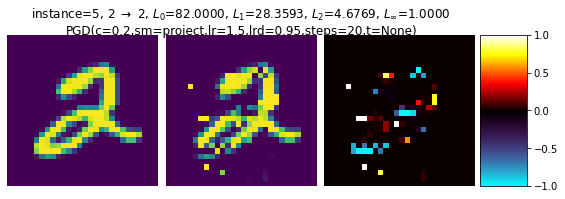

1: 1 -> 3 $L_0$=49.0000, $L_1$=18.7745, $L_2$=3.7891, $L_\infty$=1.0000


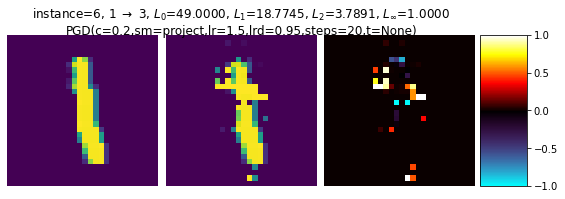

3: 3 -> 3 $L_0$=92.0000, $L_1$=25.1433, $L_2$=4.1731, $L_\infty$=1.0000


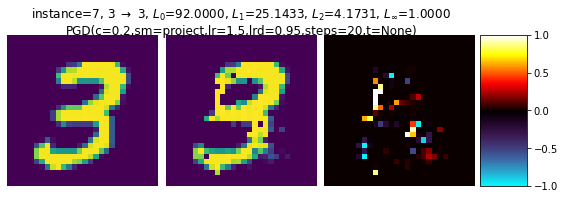

1: 1 -> 3 $L_0$=41.0000, $L_1$=19.3217, $L_2$=4.1471, $L_\infty$=1.0000


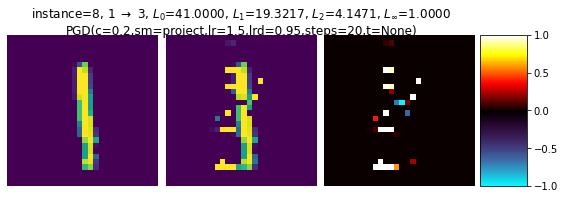

4: 4 -> 0 $L_0$=784.0000, $L_1$=698.4375, $L_2$=26.1433, $L_\infty$=1.0000


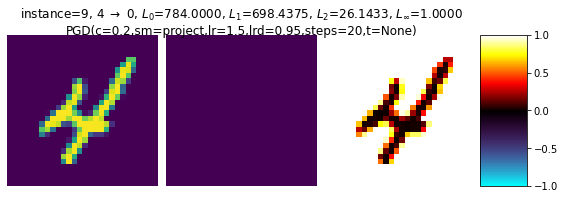

3: 3 -> 3 $L_0$=79.0000, $L_1$=22.0983, $L_2$=4.0461, $L_\infty$=1.0000


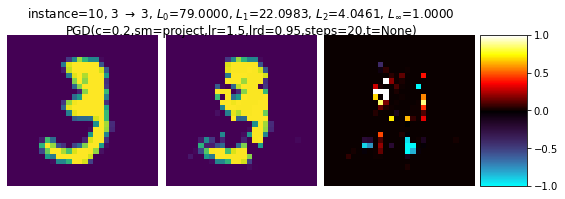

5: 5 -> 0 $L_0$=784.0000, $L_1$=728.3359, $L_2$=26.7945, $L_\infty$=1.0000


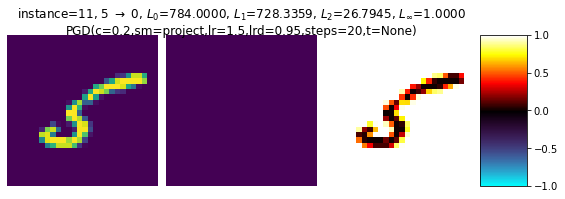

3: 3 -> 2 $L_0$=105.0000, $L_1$=31.7913, $L_2$=4.8821, $L_\infty$=1.0000


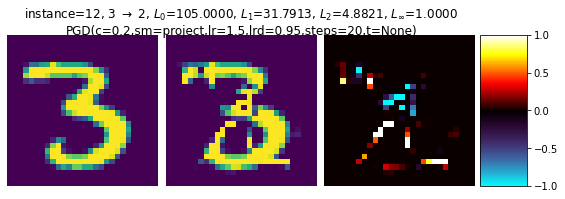

6: 6 -> 7 $L_0$=98.0000, $L_1$=40.1943, $L_2$=5.5178, $L_\infty$=1.0000


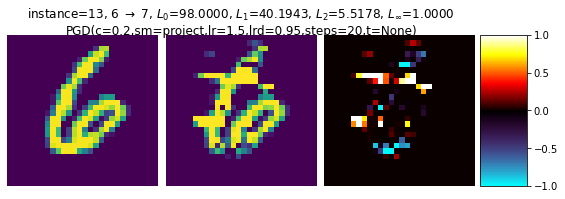

1: 1 -> 0 $L_0$=784.0000, $L_1$=738.6016, $L_2$=27.0457, $L_\infty$=1.0000


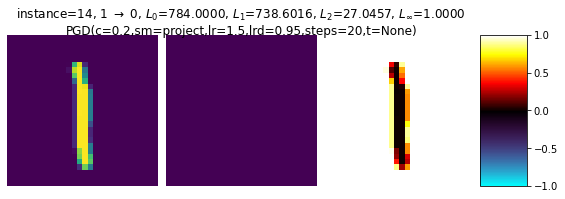

7: 7 -> 7 $L_0$=53.0000, $L_1$=14.0537, $L_2$=3.1171, $L_\infty$=1.0000


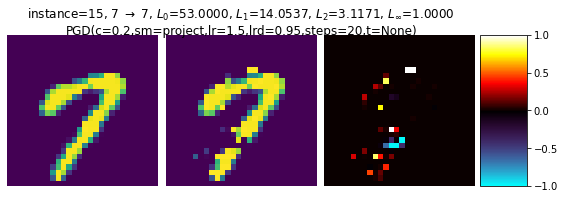

In [0]:
# evasion attack
att = hw4_part1.PGDAttacker(
    model=m,
    num_steps=20,
    target=None,
    learning_rate_decay=0.95,
    learning_rate=1.5,
    step_mode="project",
    c=0.2
)
att.evaluate(
    X=mnist_data.train.X[0:16*1],
    Y=mnist_data.train.Y[0:16*1],
    display_progress=True
)
show_attack(att, np.arange(0, 16), mnist_data.train)

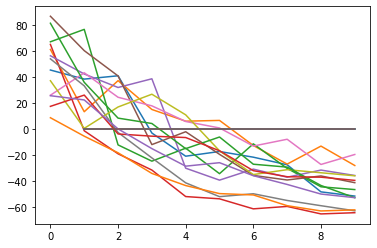

Success rate:  0.0625
Mean Distortion:  $L_0$=32.0000, $L_1$=18.1005, $L_2$=3.9648, $L_\infty$=1.0000


5: 5 -> 3 $L_0$=47.0000, $L_1$=19.1456, $L_2$=3.5773, $L_\infty$=1.0000


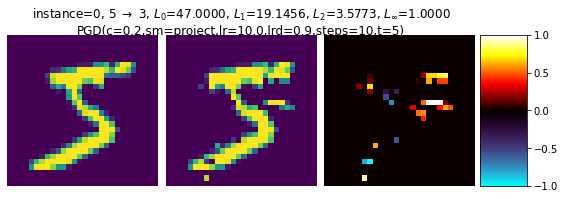

0: 0 -> 0 $L_0$=86.0000, $L_1$=33.8349, $L_2$=4.8521, $L_\infty$=1.0000


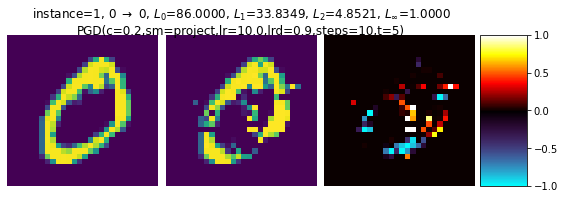

4: 4 -> 4 $L_0$=58.0000, $L_1$=25.1931, $L_2$=4.3367, $L_\infty$=1.0000


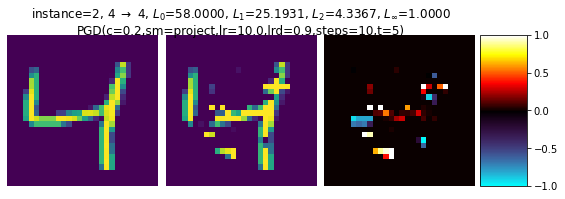

1: 1 -> 1 $L_0$=28.0000, $L_1$=12.7954, $L_2$=3.2747, $L_\infty$=1.0000


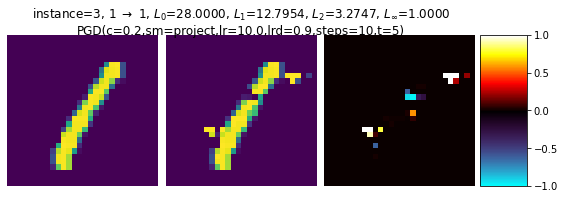

9: 9 -> 9 $L_0$=44.0000, $L_1$=18.8740, $L_2$=3.9218, $L_\infty$=1.0000


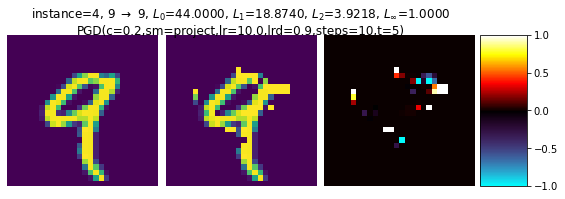

2: 2 -> 2 $L_0$=48.0000, $L_1$=10.7713, $L_2$=2.6698, $L_\infty$=1.0000


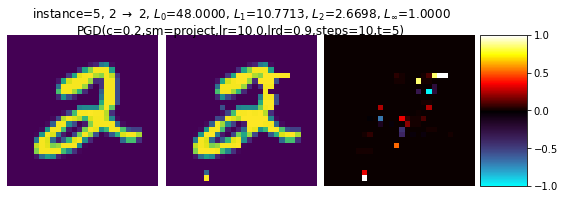

1: 1 -> 3 $L_0$=73.0000, $L_1$=38.0853, $L_2$=5.5757, $L_\infty$=1.0000


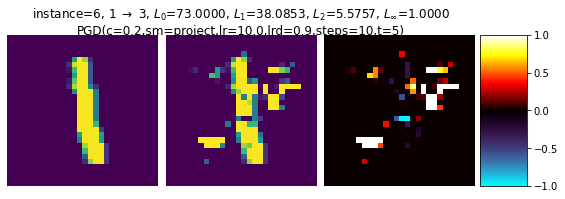

3: 3 -> 3 $L_0$=53.0000, $L_1$=19.3129, $L_2$=3.8108, $L_\infty$=1.0000


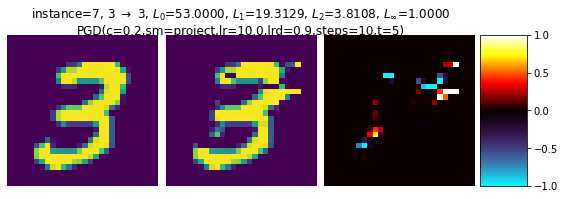

1: 1 -> 5 $L_0$=32.0000, $L_1$=18.1005, $L_2$=3.9648, $L_\infty$=1.0000


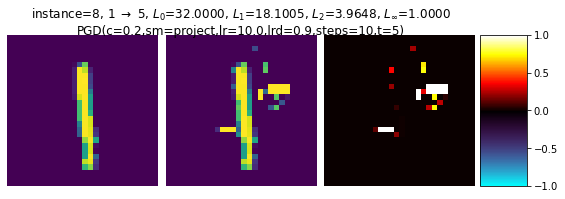

4: 4 -> 0 $L_0$=784.0000, $L_1$=698.4375, $L_2$=26.1433, $L_\infty$=1.0000


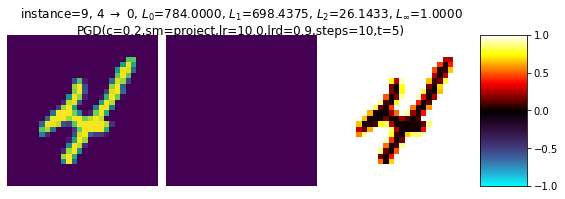

3: 3 -> 0 $L_0$=784.0000, $L_1$=672.4844, $L_2$=25.6614, $L_\infty$=1.0000


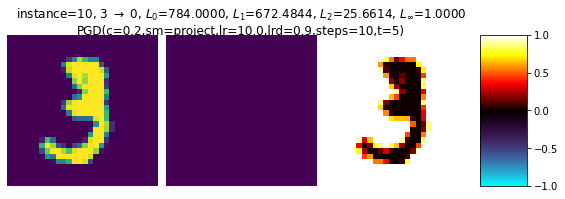

5: 5 -> 5 $L_0$=23.0000, $L_1$=7.2881, $L_2$=2.2627, $L_\infty$=1.0000


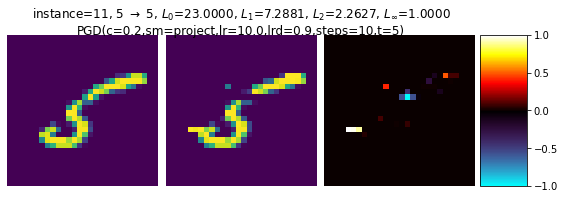

3: 3 -> 3 $L_0$=71.0000, $L_1$=28.8847, $L_2$=4.6949, $L_\infty$=1.0000


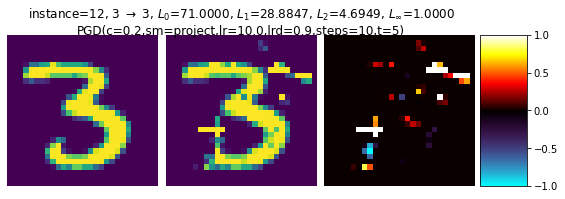

6: 6 -> 6 $L_0$=62.0000, $L_1$=22.1974, $L_2$=4.0507, $L_\infty$=1.0000


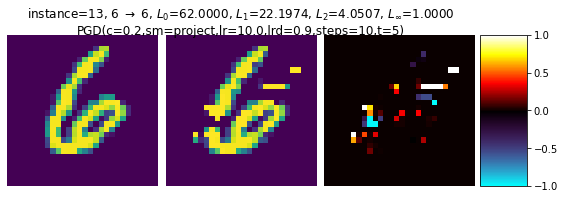

1: 1 -> 8 $L_0$=39.0000, $L_1$=22.1921, $L_2$=4.2031, $L_\infty$=1.0000


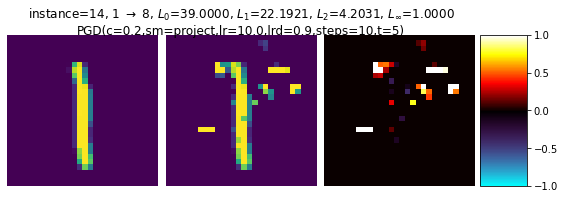

7: 7 -> 0 $L_0$=784.0000, $L_1$=685.1875, $L_2$=25.8946, $L_\infty$=1.0000


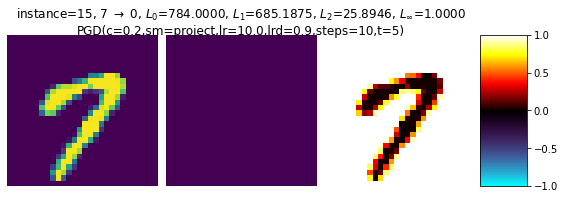

In [0]:
# targetted attack
att = hw4_part1.PGDAttacker(
    model=m,
    num_steps=10,
    target=5,
    learning_rate_decay=0.9,
    learning_rate=10.0,
    step_mode="project",
    c=0.2
)
att.evaluate(
    X=mnist_data.train.X[0:16*1],
    Y=mnist_data.train.Y[0:16*1],
    display_progress=True
)
show_attack(att, np.arange(0, 16), mnist_data.train)

Written Exercise 4:

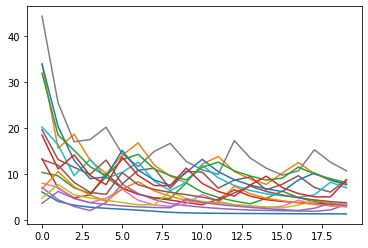

Success rate:  0.8125
Mean Distortion:  $L_0$=784.0000, $L_1$=28.4503, $L_2$=2.0309, $L_\infty$=0.8324


NameError: ignored

In [0]:
# evasion attack
att = hw4_part1.CWL2Attacker(
    model=m,
    num_steps=20,
    target=None,
    learning_rate=1.5,
    learning_rate_decay=0.95,
    k=0.0,
    c=4.5
)
att.evaluate(
    X=mnist_data.train.X[0:16*1],
    Y=mnist_data.train.Y[0:16*1],
    display_progress=True
)
show_attack(att, np.arange(0, 16), mnist_data.train)

MNIST Regular Model


In [0]:
m_reg = hw4_mnist.MNISTModel()
m_reg.load(filename=f'model.regular0.1.MNIST.h5')

Written Exercise 6


Updated Show Attack Function

In [0]:
def show_attack_exercise_6(attacker, idxs, dat, Xp):  
    X = dat.X[idxs]
    Y = dat.Y[idxs]
    
    Xp = Xp

    for x, xp, yt, idx in list(zip(X, Xp, Y, idxs)):    
        y  = np.argmax(m.model.predict(x [np.newaxis, :, :, :])[0])
        yp = np.argmax(m.model.predict(xp[np.newaxis, :, :, :])[0])
    
        d = (x-xp).flatten()

        dnorms, dnorms_str = hw4_utils.norms(np.expand_dims(d, axis=0))
    
        lim = max(abs(np.min(d)), abs(np.max(d)))
        # make colorbar limits symmetric, with black being 0
    
        print(f"{yt}: {y} -> {yp} {dnorms_str}")

        fig = plt.figure(figsize=(6.5,3))
        gs = gridspec.GridSpec(1,3, width_ratios=[2,2,2])
        axs = [plt.subplot(gs[i]) for i in range(3)]
    
        fig.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.05, hspace=0)
    
        axs[0].set_axis_off()
        axs[1].set_axis_off()
        axs[2].set_axis_off()
    
        axs[0].imshow(x[:,:,0])
        axs[1].imshow(xp[:,:,0])
        c = axs[2].imshow((xp-x)[:,:,0], cmap=hotcold_cmap, vmin=-lim, vmax=lim)
        
        cax = fig.add_axes([axs[2].get_position().x1+0.01,
                            axs[2].get_position().y0,
                            0.1,
                            axs[2].get_position().y1 - axs[2].get_position().y0])
        
        fig.colorbar(mappable=c, cax=cax)
        
        fig.suptitle(f"instance={idx}, {y} $\\rightarrow$ {yp}, {dnorms_str}\n{str(att)}")
    
        display(fig)
        
    plt.close('all')

Generate Adversarial Examples to be evaluated by both models

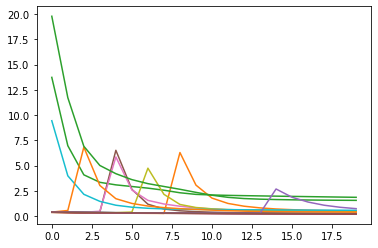

Success rate:  0.9375
Mean Distortion:  $L_0$=777.4000, $L_1$=13.4535, $L_2$=0.6280, $L_\infty$=0.1841
5: 5 -> 3 $L_0$=784.0000, $L_1$=17.4152, $L_2$=0.8096, $L_\infty$=0.3626


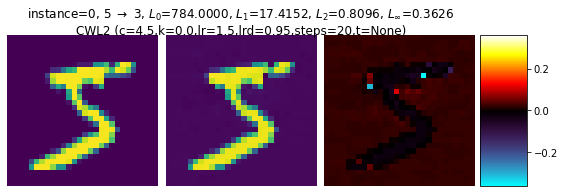

0: 0 -> 2 $L_0$=784.0000, $L_1$=39.8557, $L_2$=2.7954, $L_\infty$=0.9695


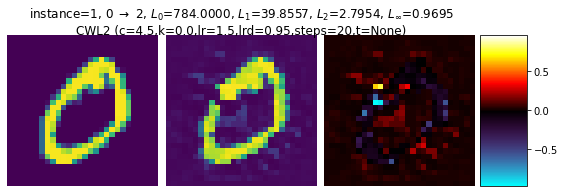

4: 4 -> 4 $L_0$=784.0000, $L_1$=25.0646, $L_2$=1.5563, $L_\infty$=0.5588


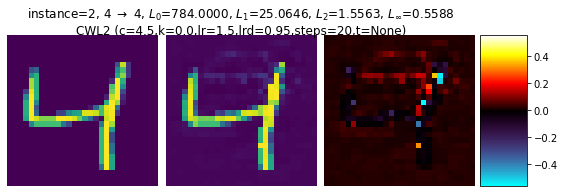

1: 1 -> 4 $L_0$=784.0000, $L_1$=34.4025, $L_2$=2.4751, $L_\infty$=0.9738


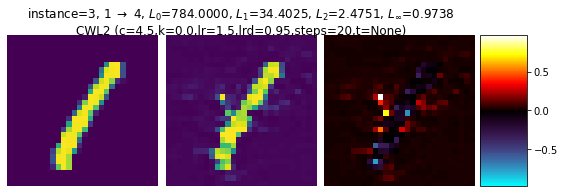

9: 9 -> 8 $L_0$=784.0000, $L_1$=26.6665, $L_2$=1.7063, $L_\infty$=0.8923


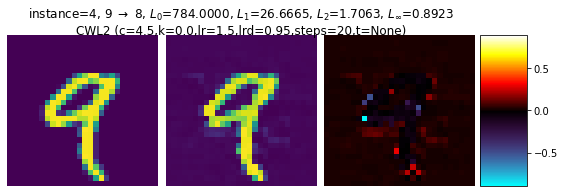

2: 2 -> 8 $L_0$=784.0000, $L_1$=30.2884, $L_2$=2.0028, $L_\infty$=0.9486


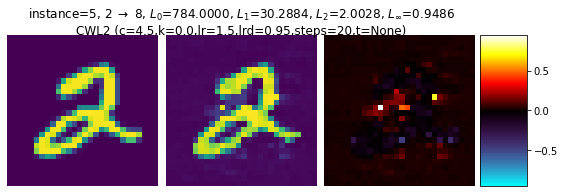

1: 1 -> 3 $L_0$=784.0000, $L_1$=27.3120, $L_2$=2.2241, $L_\infty$=0.8334


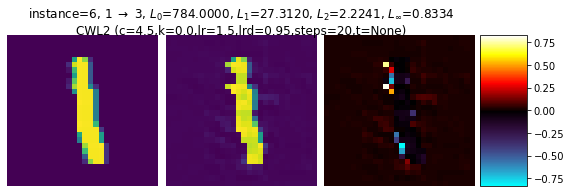

3: 3 -> 9 $L_0$=784.0000, $L_1$=34.5099, $L_2$=2.4025, $L_\infty$=0.9163


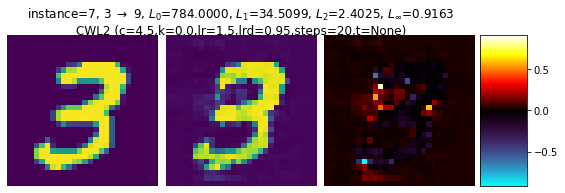

1: 1 -> 8 $L_0$=784.0000, $L_1$=26.4867, $L_2$=1.7784, $L_\infty$=0.6454


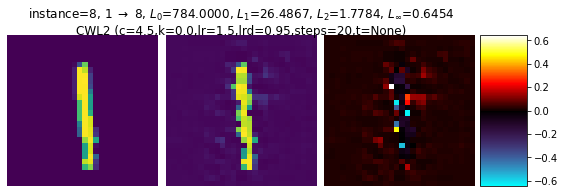

4: 4 -> 1 $L_0$=784.0000, $L_1$=33.4532, $L_2$=2.1279, $L_\infty$=0.7668


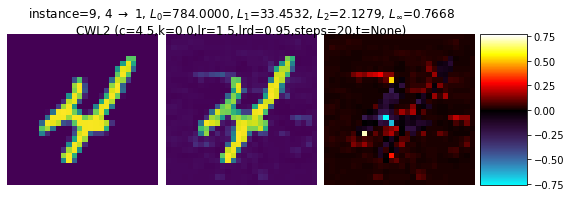

3: 3 -> 9 $L_0$=784.0000, $L_1$=25.3578, $L_2$=1.5538, $L_\infty$=0.6434


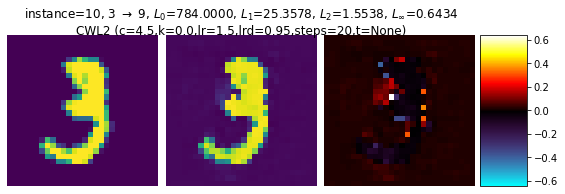

5: 5 -> 6 $L_0$=784.0000, $L_1$=27.0269, $L_2$=1.6486, $L_\infty$=0.8665


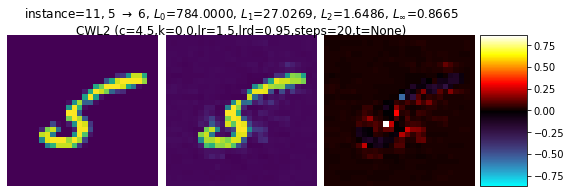

3: 3 -> 3 $L_0$=784.0000, $L_1$=34.6991, $L_2$=2.2903, $L_\infty$=0.6658


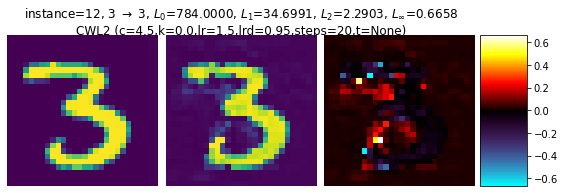

6: 6 -> 0 $L_0$=784.0000, $L_1$=27.7635, $L_2$=1.9231, $L_\infty$=0.9696


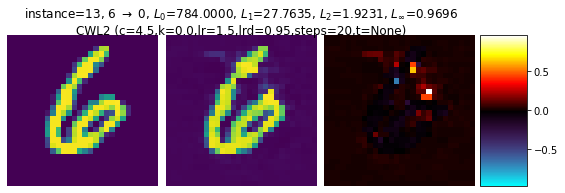

1: 1 -> 8 $L_0$=784.0000, $L_1$=27.2311, $L_2$=1.5892, $L_\infty$=0.5243


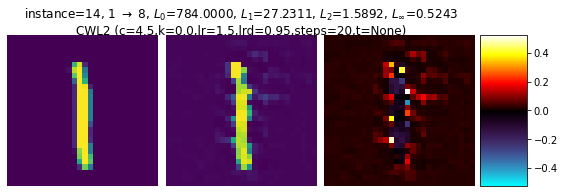

7: 7 -> 9 $L_0$=784.0000, $L_1$=24.4290, $L_2$=1.7094, $L_\infty$=0.6977


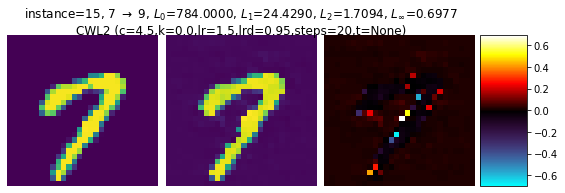

In [0]:
m._prepare_model()
att = hw4_part1.CWL2Attacker(
    model=m,
    num_steps=20,
    target=None,
    learning_rate=1.5,
    learning_rate_decay=0.95,
    k=0.0,
    c=4.5
)
Xp = att.attack_batch(mnist_data.train.X[np.arange(0,16)], mnist_data.train.Y[np.arange(0, 16)])
att.evaluate(
    X=Xp,
    Y=mnist_data.train.Y[0:16*1],
    display_progress=True
)
show_attack_exercise_6(att, np.arange(0, 16), mnist_data.train, Xp)

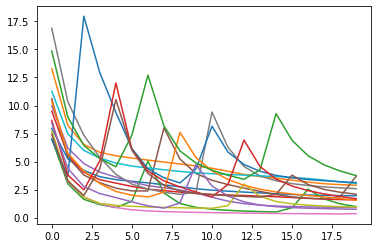

Success rate:  1.0
Mean Distortion:  $L_0$=783.9375, $L_1$=17.7838, $L_2$=1.2722, $L_\infty$=0.6673
5: 5 -> 3 $L_0$=784.0000, $L_1$=17.4152, $L_2$=0.8096, $L_\infty$=0.3626


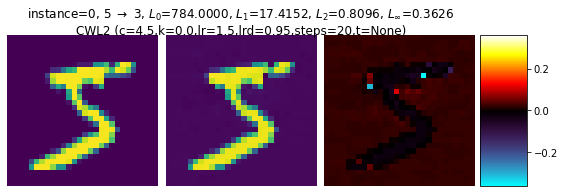

0: 0 -> 2 $L_0$=784.0000, $L_1$=39.8557, $L_2$=2.7954, $L_\infty$=0.9695


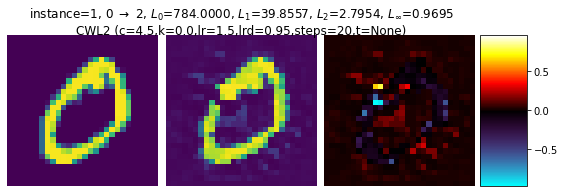

4: 4 -> 4 $L_0$=784.0000, $L_1$=25.0646, $L_2$=1.5563, $L_\infty$=0.5588


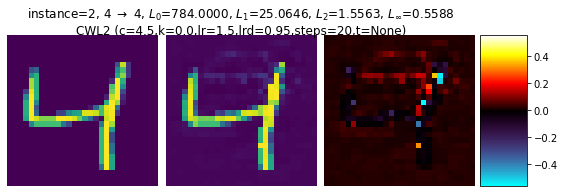

1: 1 -> 4 $L_0$=784.0000, $L_1$=34.4025, $L_2$=2.4751, $L_\infty$=0.9738


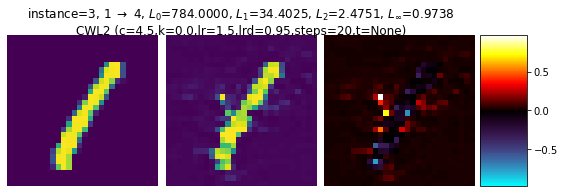

9: 9 -> 8 $L_0$=784.0000, $L_1$=26.6665, $L_2$=1.7063, $L_\infty$=0.8923


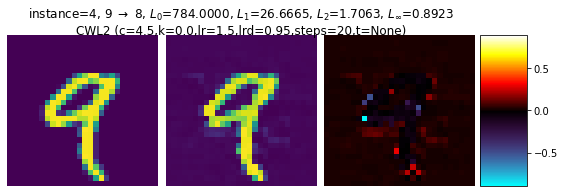

2: 2 -> 8 $L_0$=784.0000, $L_1$=30.2884, $L_2$=2.0028, $L_\infty$=0.9486


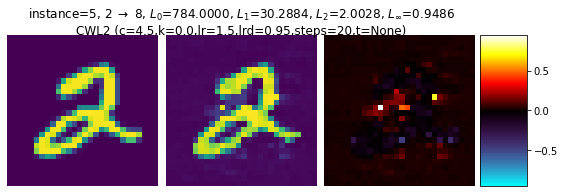

1: 1 -> 3 $L_0$=784.0000, $L_1$=27.3120, $L_2$=2.2241, $L_\infty$=0.8334


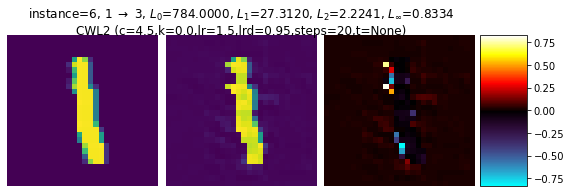

3: 3 -> 9 $L_0$=784.0000, $L_1$=34.5099, $L_2$=2.4025, $L_\infty$=0.9163


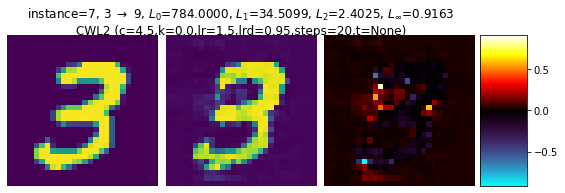

1: 1 -> 8 $L_0$=784.0000, $L_1$=26.4867, $L_2$=1.7784, $L_\infty$=0.6454


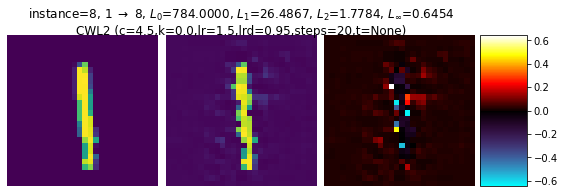

4: 4 -> 1 $L_0$=784.0000, $L_1$=33.4532, $L_2$=2.1279, $L_\infty$=0.7668


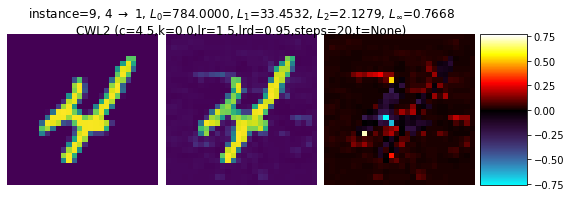

3: 3 -> 9 $L_0$=784.0000, $L_1$=25.3578, $L_2$=1.5538, $L_\infty$=0.6434


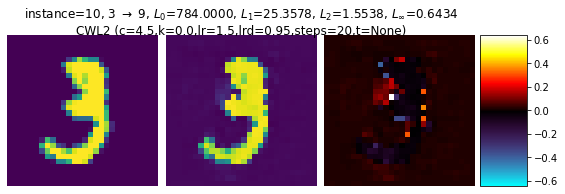

5: 5 -> 6 $L_0$=784.0000, $L_1$=27.0269, $L_2$=1.6486, $L_\infty$=0.8665


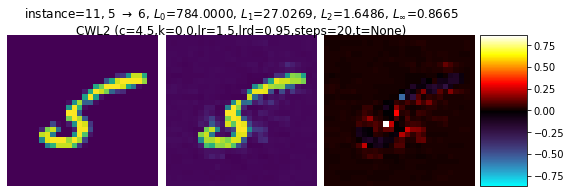

3: 3 -> 3 $L_0$=784.0000, $L_1$=34.6991, $L_2$=2.2903, $L_\infty$=0.6658


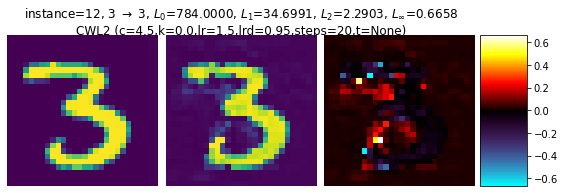

6: 6 -> 0 $L_0$=784.0000, $L_1$=27.7635, $L_2$=1.9231, $L_\infty$=0.9696


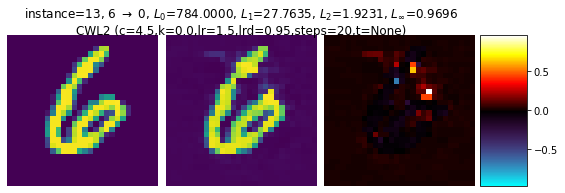

1: 1 -> 8 $L_0$=784.0000, $L_1$=27.2311, $L_2$=1.5892, $L_\infty$=0.5243


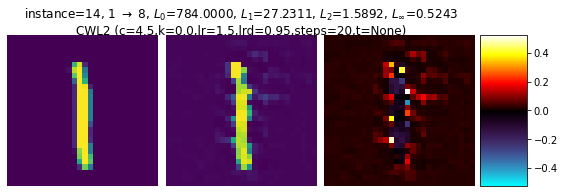

7: 7 -> 9 $L_0$=784.0000, $L_1$=24.4290, $L_2$=1.7094, $L_\infty$=0.6977


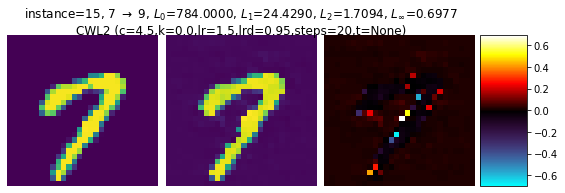

In [0]:
m_reg._prepare_model()
att = hw4_part1.CWL2Attacker(
    model=m_reg,
    num_steps=20,
    target=None,
    learning_rate=1.5,
    learning_rate_decay=0.95,
    k=0.0,
    c=4.5
)
att.evaluate(
    X=Xp,
    Y=mnist_data.train.Y[0:16*1],
    display_progress=True
)
show_attack_exercise_6(att, np.arange(0, 16), mnist_data.train, Xp)

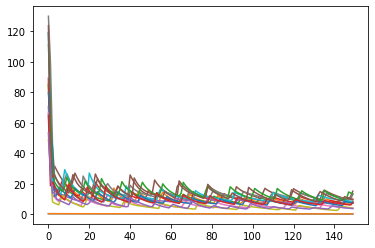

Success rate:  0.8125
Mean Distortion:  $L_0$=784.0000, $L_1$=34.3463, $L_2$=2.5236, $L_\infty$=0.9556


5: 5 -> 5 $L_0$=765.0000, $L_1$=14.5090, $L_2$=0.5510, $L_\infty$=0.0213


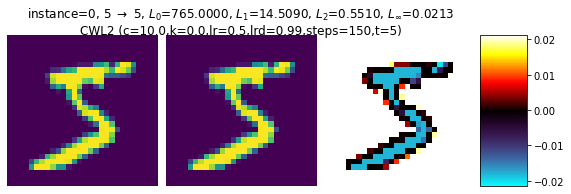

0: 0 -> 5 $L_0$=784.0000, $L_1$=35.6347, $L_2$=2.5899, $L_\infty$=0.9814


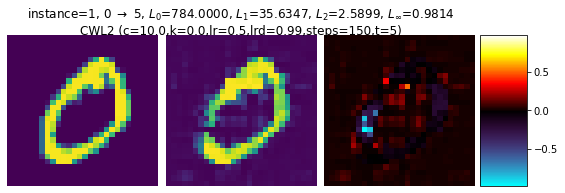

4: 4 -> 5 $L_0$=784.0000, $L_1$=33.9689, $L_2$=2.6084, $L_\infty$=0.9921


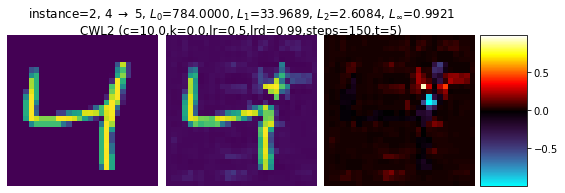

1: 1 -> 5 $L_0$=784.0000, $L_1$=34.4239, $L_2$=2.7188, $L_\infty$=0.9909


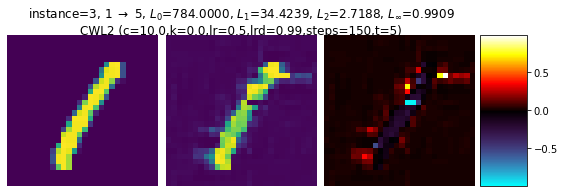

9: 9 -> 5 $L_0$=784.0000, $L_1$=31.7870, $L_2$=2.6184, $L_\infty$=0.9722


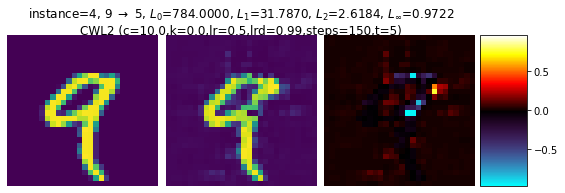

2: 2 -> 5 $L_0$=784.0000, $L_1$=42.6012, $L_2$=3.1015, $L_\infty$=0.9827


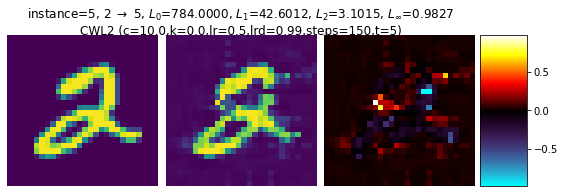

1: 1 -> 5 $L_0$=784.0000, $L_1$=29.1156, $L_2$=1.9847, $L_\infty$=0.9990


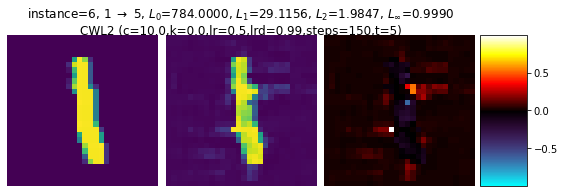

3: 3 -> 5 $L_0$=784.0000, $L_1$=39.7190, $L_2$=3.0848, $L_\infty$=0.9797


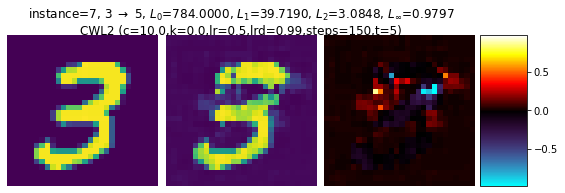

1: 1 -> 5 $L_0$=784.0000, $L_1$=26.6807, $L_2$=1.6075, $L_\infty$=0.6710


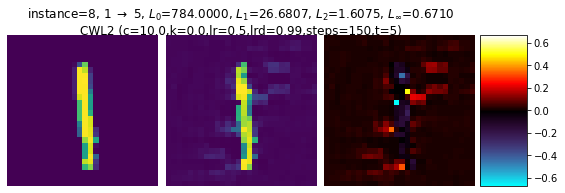

4: 4 -> 5 $L_0$=784.0000, $L_1$=35.1928, $L_2$=2.8796, $L_\infty$=0.9943


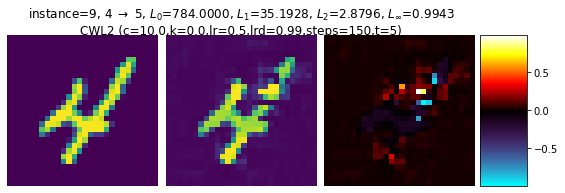

3: 3 -> 5 $L_0$=784.0000, $L_1$=32.6176, $L_2$=2.3835, $L_\infty$=0.9991


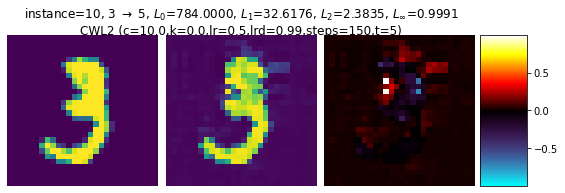

5: 5 -> 5 $L_0$=769.0000, $L_1$=15.3394, $L_2$=0.5696, $L_\infty$=0.0213


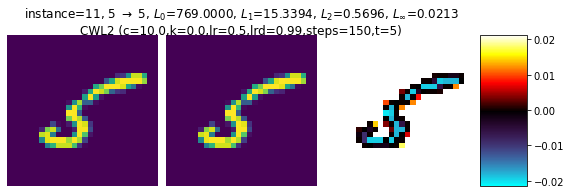

3: 3 -> 3 $L_0$=784.0000, $L_1$=42.7762, $L_2$=3.0403, $L_\infty$=0.7626


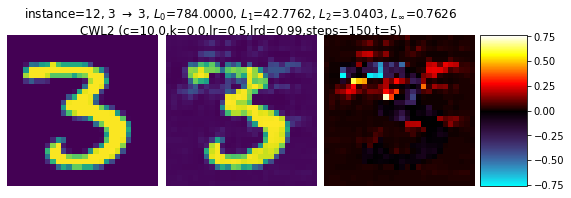

6: 6 -> 5 $L_0$=784.0000, $L_1$=34.5134, $L_2$=2.4763, $L_\infty$=0.9943


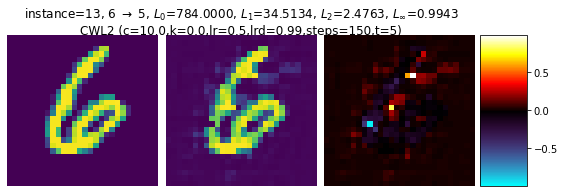

1: 1 -> 5 $L_0$=784.0000, $L_1$=29.0688, $L_2$=1.8676, $L_\infty$=0.8819


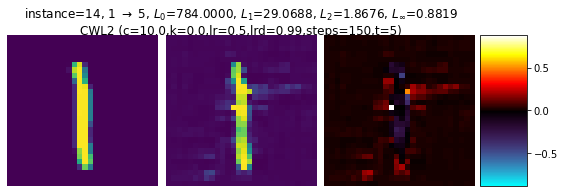

7: 7 -> 5 $L_0$=784.0000, $L_1$=41.1789, $L_2$=2.8864, $L_\infty$=0.9841


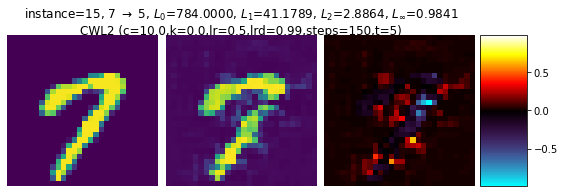

In [0]:
# targetted attack
att = hw4_part1.CWL2Attacker(
    model=m,
    num_steps=150,
    target=5,
    learning_rate=0.5,
    learning_rate_decay=0.99,
    k=0.0,
    c=10.0
)
att.evaluate(
    X=mnist_data.train.X[0:16*1],
    Y=mnist_data.train.Y[0:16*1],
    display_progress=True
)
show_attack(att, np.arange(0, 16), mnist_data.train)

# PART 2

In [0]:
import hw4_mnist
import hw4_part1
import hw4_part2
hw4_part1.tqdm = tqdm
hw4_part2.tqdm = tqdm

In [0]:
def evaluate_defense(
    X, Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=None,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.AugmentDefender,
    defender_params=dict(finetune=False, epochs=10),
    defend_params=dict(augment_ratio=1.0),
):

    m = model_class()
    m.load()
    
    att = attacker_class(
        model=m,
        **attack_params
    )

    X = X[0:sample_size]
    Y = Y[0:sample_size]
    
    print("=== before defense ===")
    
    # Check prediction performance before defense.
    pre_acc = {sname: (m.f_preds(s.X) == s.Y).mean()
               for sname, s in zip(["train", "test", "valid"], mnist_data)}
    print(pre_acc)
    
    # Check adversarial success before defense.
    pre_s, pre_dist = att.evaluate(X=X, Y=Y)
    
    d = defender_class(
        attacker=att,
        model=m,
        **defender_params
    )
    
    d.defend(
        X, Y,
        **defend_params
    )
    
    att = attacker_class(
        model=d.model,
        **attack_params
    )

    print("=== after defense ===")
    # Check prediction performance after defense.
    post_acc = {sname: (m.f_preds(s.X) == s.Y).mean()
               for sname, s in zip(["train", "test", "valid"], mnist_data)}
    print(post_acc)
    
    # Check adversarial success after the defense.
    # Note that checking on the same set that we defended against
    # might not be a fair check for successful defense.
    post_s, post_dist = att.evaluate(X=X, Y=Y)
    
    plt.close('all')
    
    print("=== defense results ===")
    for sname in pre_acc.keys():
        pre = pre_acc[sname]
        post = post_acc[sname]
        print(f"{sname} acc:\t{pre:0.4f} -> {post:0.4f}\t({post-pre:0.4f} {100 * (post-pre)/pre:0.4f}% change)")
    
    print(f"adv success:\t{100*pre_s:0.4f}% -> {100*post_s:0.4f}%\t({post_s-pre_s:0.4f} {100 * (post_s-pre_s)/pre_s:0.4f}% change)")
    for pre_d, post_d, l in zip(pre_dist, post_dist, ["L0", "L1", "L2", "Linf"]):
        print(f"{l} distortion:\t{pre_d:0.4f} -> {post_d:0.4f}\t({post_d-pre_d:0.4f} {100 * (post_d-pre_d)/pre_d:0.4f}% change)")


Written Exercise 10

Augement Defender No Target


Finetune = False

In [0]:
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=None,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.AugmentDefender,
    defender_params=dict(finetune=False, epochs=10),
    defend_params=dict(augment_ratio=1.0),
)

=== before defense ===
{'train': 0.97574, 'test': 0.9771, 'valid': 0.9805}
Target = None evaluation


Success rate:  0.92578125
Mean Distortion:  $L_0$=772.7257, $L_1$=33.9007, $L_2$=3.3192, $L_\infty$=0.9071


Train on 512 samples
Epoch 1/10
512/512 [==============================] - 0s 377us/sample - loss: 2.2304 - acc: 0.1973
Epoch 2/10
512/512 [==============================] - 0s 173us/sample - loss: 1.8452 - acc: 0.4688
Epoch 3/10
512/512 [==============================] - 0s 182us/sample - loss: 1.0363 - acc: 0.7305
Epoch 4/10
512/512 [==============================] - 0s 172us/sample - loss: 0.6113 - acc: 0.8320
Epoch 5/10
512/512 [==============================] - 0s 176us/sample - loss: 0.4542 - acc: 0.8594
Epoch 6/10
512/512 [==============================] - 0s 182us/sample - loss: 0.3139 - acc: 0.9082
Epoch 7/10
512/512 [==============================] - 0s 189us/sample - loss: 0.2461 - acc: 0.9258
Epoch 8/10
512/512 [==============================] - 0s 177us/sample - loss: 0.1463 - acc: 0.9805
Epoch 9/10
512/512 [==============================] - 0s 187us/sample - loss: 0.1150 - acc: 0.9805
Epoch 10/10
512/512 [==============================] - 0s 185us/sample - loss: 0.0782 - 

Success rate:  0.828125
Mean Distortion:  $L_0$=775.6038, $L_1$=31.5067, $L_2$=2.7976, $L_\infty$=0.8740
=== defense results ===
train acc:	0.9757 -> 0.8143	(-0.1615 -16.5495% change)
test acc:	0.9771 -> 0.8375	(-0.1396 -14.2872% change)
valid acc:	0.9805 -> 0.8323	(-0.1482 -15.1147% change)
adv success:	92.5781% -> 82.8125%	(-0.0977 -10.5485% change)
L0 distortion:	772.7257 -> 775.6038	(2.8781 0.3725% change)
L1 distortion:	33.9007 -> 31.5067	(-2.3940 -7.0618% change)
L2 distortion:	3.3192 -> 2.7976	(-0.5217 -15.7170% change)
Linf distortion:	0.9071 -> 0.8740	(-0.0331 -3.6506% change)


FineTune = True

In [0]:
m._prepare_model()
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=None,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.AugmentDefender,
    defender_params=dict(finetune=True, epochs=10),
    defend_params=dict(augment_ratio=1.0),
)

Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 13s 252us/sample - loss: 0.1938 - acc: 0.9415 - val_loss: 0.0759 - val_acc: 0.9801
=== before defense ===
{'train': 0.97734, 'test': 0.9801, 'valid': 0.9793}
Target = None evaluation


Success rate:  0.9140625
Mean Distortion:  $L_0$=771.9615, $L_1$=33.7164, $L_2$=3.3201, $L_\infty$=0.9055


Train on 256 samples
Epoch 1/10
256/256 [==============================] - 0s 2ms/sample - loss: 1.7116 - acc: 0.4531
Epoch 2/10
256/256 [==============================] - 0s 194us/sample - loss: 1.0014 - acc: 0.6562
Epoch 3/10
256/256 [==============================] - 0s 207us/sample - loss: 0.6398 - acc: 0.7305
Epoch 4/10
256/256 [==============================] - 0s 216us/sample - loss: 0.4919 - acc: 0.7969
Epoch 5/10
256/256 [==============================] - 0s 205us/sample - loss: 0.3889 - acc: 0.8672
Epoch 6/10
256/256 [==============================] - 0s 207us/sample - loss: 0.3119 - acc: 0.8945
Epoch 7/10
256/256 [==============================] - 0s 215us/sample - loss: 0.2703 - acc: 0.9102
Epoch 8/10
256/256 [==============================] - 0s 204us/sample - loss: 0.2409 - acc: 0.9141
Epoch 9/10
256/256 [==============================] - 0s 195us/sample - loss: 0.1645 - acc: 0.9453
Epoch 10/10
256/256 [==============================] - 0s 211us/sample - loss: 0.1352 - ac

Success rate:  0.83203125
Mean Distortion:  $L_0$=777.4930, $L_1$=35.5395, $L_2$=3.3575, $L_\infty$=0.9320
=== defense results ===
train acc:	0.9773 -> 0.9546	(-0.0227 -2.3226% change)
test acc:	0.9801 -> 0.9619	(-0.0182 -1.8570% change)
valid acc:	0.9793 -> 0.9576	(-0.0217 -2.2159% change)
adv success:	91.4062% -> 83.2031%	(-0.0820 -8.9744% change)
L0 distortion:	771.9615 -> 777.4930	(5.5314 0.7165% change)
L1 distortion:	33.7164 -> 35.5395	(1.8232 5.4074% change)
L2 distortion:	3.3201 -> 3.3575	(0.0374 1.1278% change)
Linf distortion:	0.9055 -> 0.9320	(0.0264 2.9177% change)


Augment Defender with a Target Value

FineTune = False

In [0]:
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=5,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.AugmentDefender,
    defender_params=dict(finetune=False, epochs=10),
    defend_params=dict(augment_ratio=1.0),
)

=== before defense ===
{'train': 0.97604, 'test': 0.9756, 'valid': 0.9753}
Target = 5 evaluation


Success rate:  0.828125
Mean Distortion:  $L_0$=776.5236, $L_1$=38.2143, $L_2$=3.7824, $L_\infty$=0.9602


Train on 512 samples
Epoch 1/10
512/512 [==============================] - 0s 944us/sample - loss: 2.1974 - acc: 0.2207
Epoch 2/10
512/512 [==============================] - 0s 185us/sample - loss: 1.6353 - acc: 0.5176
Epoch 3/10
512/512 [==============================] - 0s 185us/sample - loss: 0.9215 - acc: 0.7441
Epoch 4/10
512/512 [==============================] - 0s 189us/sample - loss: 0.6326 - acc: 0.8125
Epoch 5/10
512/512 [==============================] - 0s 193us/sample - loss: 0.4585 - acc: 0.8555
Epoch 6/10
512/512 [==============================] - 0s 191us/sample - loss: 0.3545 - acc: 0.8945
Epoch 7/10
512/512 [==============================] - 0s 190us/sample - loss: 0.2935 - acc: 0.9062
Epoch 8/10
512/512 [==============================] - 0s 187us/sample - loss: 0.2362 - acc: 0.9414
Epoch 9/10
512/512 [==============================] - 0s 197us/sample - loss: 0.1788 - acc: 0.9551
Epoch 10/10
512/512 [==============================] - 0s 190us/sample - loss: 0.1125 - 

Success rate:  0.43359375
Mean Distortion:  $L_0$=782.7748, $L_1$=42.2250, $L_2$=3.5211, $L_\infty$=0.9607
=== defense results ===
train acc:	0.9760 -> 0.8176	(-0.1585 -16.2350% change)
test acc:	0.9756 -> 0.8439	(-0.1317 -13.4994% change)
valid acc:	0.9753 -> 0.8300	(-0.1453 -14.8980% change)
adv success:	82.8125% -> 43.3594%	(-0.3945 -47.6415% change)
L0 distortion:	776.5236 -> 782.7748	(6.2512 0.8050% change)
L1 distortion:	38.2143 -> 42.2250	(4.0107 10.4953% change)
L2 distortion:	3.7824 -> 3.5211	(-0.2613 -6.9082% change)
Linf distortion:	0.9602 -> 0.9607	(0.0004 0.0459% change)


FineTune = True

In [0]:
m._prepare_model()
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=5,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.AugmentDefender,
    defender_params=dict(finetune=True, epochs=10),
    defend_params=dict(augment_ratio=1.0),
)

Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 12s 246us/sample - loss: 0.2113 - acc: 0.9340 - val_loss: 0.0774 - val_acc: 0.9756
=== before defense ===
{'train': 0.97604, 'test': 0.9756, 'valid': 0.9753}
Target = 5 evaluation


Success rate:  0.828125
Mean Distortion:  $L_0$=776.5236, $L_1$=38.2143, $L_2$=3.7824, $L_\infty$=0.9602


Train on 256 samples
Epoch 1/10
256/256 [==============================] - 0s 2ms/sample - loss: 0.5585 - acc: 0.8008
Epoch 2/10
256/256 [==============================] - 0s 195us/sample - loss: 0.2853 - acc: 0.9180
Epoch 3/10
256/256 [==============================] - 0s 198us/sample - loss: 0.1757 - acc: 0.9609
Epoch 4/10
256/256 [==============================] - 0s 186us/sample - loss: 0.1161 - acc: 0.9805
Epoch 5/10
256/256 [==============================] - 0s 195us/sample - loss: 0.0883 - acc: 0.9883
Epoch 6/10
256/256 [==============================] - 0s 191us/sample - loss: 0.0797 - acc: 0.9766
Epoch 7/10
256/256 [==============================] - 0s 192us/sample - loss: 0.0674 - acc: 0.9883
Epoch 8/10
256/256 [==============================] - 0s 208us/sample - loss: 0.0428 - acc: 0.9922
Epoch 9/10
256/256 [==============================] - 0s 247us/sample - loss: 0.0273 - acc: 1.0000
Epoch 10/10
256/256 [==============================] - 0s 204us/sample - loss: 0.0240 - ac

Success rate:  0.52734375
Mean Distortion:  $L_0$=778.7704, $L_1$=75.3540, $L_2$=6.7408, $L_\infty$=0.9999
=== defense results ===
train acc:	0.9760 -> 0.8812	(-0.0949 -9.7189% change)
test acc:	0.9756 -> 0.8836	(-0.0920 -9.4301% change)
valid acc:	0.9753 -> 0.8893	(-0.0860 -8.8178% change)
adv success:	82.8125% -> 52.7344%	(-0.3008 -36.3208% change)
L0 distortion:	776.5236 -> 778.7704	(2.2468 0.2893% change)
L1 distortion:	38.2143 -> 75.3540	(37.1396 97.1877% change)
L2 distortion:	3.7824 -> 6.7408	(2.9584 78.2153% change)
Linf distortion:	0.9602 -> 0.9999	(0.0397 4.1310% change)


Pre-Madry Defense No Target

FineTune = False

In [0]:
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=None,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=512,
    defender_class=hw4_part2.PreMadryDefender,
    defender_params=dict(finetune=False, epochs=10),
    defend_params=dict(),
)

=== before defense ===
{'train': 0.97784, 'test': 0.9778, 'valid': 0.9782}
Target = None evaluation


Success rate:  0.935546875
Mean Distortion:  $L_0$=771.1127, $L_1$=32.7559, $L_2$=3.1874, $L_\infty$=0.8848


=== after defense ===
{'train': 0.83074, 'test': 0.8593, 'valid': 0.8412}
Target = None evaluation


Success rate:  0.806640625
Mean Distortion:  $L_0$=770.6029, $L_1$=29.6501, $L_2$=2.3286, $L_\infty$=0.7676
=== defense results ===
train acc:	0.9778 -> 0.8307	(-0.1471 -15.0434% change)
test acc:	0.9778 -> 0.8593	(-0.1185 -12.1190% change)
valid acc:	0.9782 -> 0.8412	(-0.1370 -14.0053% change)
adv success:	93.5547% -> 80.6641%	(-0.1289 -13.7787% change)
L0 distortion:	771.1127 -> 770.6029	(-0.5098 -0.0661% change)
L1 distortion:	32.7559 -> 29.6501	(-3.1057 -9.4814% change)
L2 distortion:	3.1874 -> 2.3286	(-0.8588 -26.9424% change)
Linf distortion:	0.8848 -> 0.7676	(-0.1172 -13.2413% change)


FineTune = True

In [0]:
m._prepare_model()
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=None,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.PreMadryDefender,
    defender_params=dict(finetune=True, epochs=10),
    defend_params=dict(),
)

Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 11s 225us/sample - loss: 0.2046 - acc: 0.9364 - val_loss: 0.0748 - val_acc: 0.9785
=== before defense ===
{'train': 0.97774, 'test': 0.9785, 'valid': 0.9809}
Target = None evaluation


Success rate:  0.91015625
Mean Distortion:  $L_0$=772.7511, $L_1$=33.2011, $L_2$=3.2635, $L_\infty$=0.9036


=== after defense ===
{'train': 0.92792, 'test': 0.9391, 'valid': 0.935}
Target = None evaluation


Success rate:  0.765625
Mean Distortion:  $L_0$=778.8163, $L_1$=38.7348, $L_2$=3.4771, $L_\infty$=0.9086
=== defense results ===
train acc:	0.9777 -> 0.9279	(-0.0498 -5.0954% change)
test acc:	0.9785 -> 0.9391	(-0.0394 -4.0266% change)
valid acc:	0.9809 -> 0.9350	(-0.0459 -4.6794% change)
adv success:	91.0156% -> 76.5625%	(-0.1445 -15.8798% change)
L0 distortion:	772.7511 -> 778.8163	(6.0652 0.7849% change)
L1 distortion:	33.2011 -> 38.7348	(5.5338 16.6675% change)
L2 distortion:	3.2635 -> 3.4771	(0.2136 6.5438% change)
Linf distortion:	0.9036 -> 0.9086	(0.0050 0.5486% change)


Pre-Madry Defense with a Target Value

FineTune = False

In [0]:
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=5,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=512,
    defender_class=hw4_part2.PreMadryDefender,
    defender_params=dict(finetune=False, epochs=10),
    defend_params=dict(),
)

=== before defense ===
{'train': 0.97784, 'test': 0.9778, 'valid': 0.9782}
Target = 5 evaluation


Success rate:  0.80078125
Mean Distortion:  $L_0$=775.7610, $L_1$=38.6604, $L_2$=3.8795, $L_\infty$=0.9581


=== after defense ===
{'train': 0.82468, 'test': 0.8458, 'valid': 0.8333}
Target = 5 evaluation


Success rate:  0.576171875
Mean Distortion:  $L_0$=783.6237, $L_1$=48.7412, $L_2$=4.1573, $L_\infty$=0.9905
=== defense results ===
train acc:	0.9778 -> 0.8247	(-0.1532 -15.6631% change)
test acc:	0.9778 -> 0.8458	(-0.1320 -13.4997% change)
valid acc:	0.9782 -> 0.8333	(-0.1449 -14.8129% change)
adv success:	80.0781% -> 57.6172%	(-0.2246 -28.0488% change)
L0 distortion:	775.7610 -> 783.6237	(7.8627 1.0136% change)
L1 distortion:	38.6604 -> 48.7412	(10.0808 26.0752% change)
L2 distortion:	3.8795 -> 4.1573	(0.2778 7.1599% change)
Linf distortion:	0.9581 -> 0.9905	(0.0324 3.3825% change)


FineTune = True

In [0]:
m._prepare_model()
evaluate_defense(
    X=mnist_data.valid.X,
    Y=mnist_data.valid.Y,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=5,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.PreMadryDefender,
    defender_params=dict(finetune=True, epochs=10),
    defend_params=dict(),
)

Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 13s 257us/sample - loss: 0.1872 - acc: 0.9429 - val_loss: 0.0858 - val_acc: 0.9769
=== before defense ===
{'train': 0.97534, 'test': 0.9769, 'valid': 0.9751}
Target = 5 evaluation


Success rate:  0.80078125
Mean Distortion:  $L_0$=777.8732, $L_1$=41.5003, $L_2$=4.1053, $L_\infty$=0.9672


=== after defense ===
{'train': 0.64438, 'test': 0.6523, 'valid': 0.6564}
Target = 5 evaluation


Success rate:  0.0703125
Mean Distortion:  $L_0$=773.5555, $L_1$=93.4863, $L_2$=7.9603, $L_\infty$=1.0000
=== defense results ===
train acc:	0.9753 -> 0.6444	(-0.3310 -33.9328% change)
test acc:	0.9769 -> 0.6523	(-0.3246 -33.2276% change)
valid acc:	0.9751 -> 0.6564	(-0.3187 -32.6838% change)
adv success:	80.0781% -> 7.0312%	(-0.7305 -91.2195% change)
L0 distortion:	777.8732 -> 773.5555	(-4.3176 -0.5551% change)
L1 distortion:	41.5003 -> 93.4863	(51.9861 125.2669% change)
L2 distortion:	4.1053 -> 7.9603	(3.8550 93.9024% change)
Linf distortion:	0.9672 -> 1.0000	(0.0328 3.3860% change)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


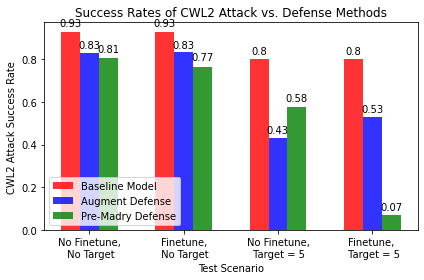

In [2]:
# data to plot
n_groups = 4
success_rate_Baseline = (0.92578125, 0.92578125, 0.80078125, 0.80078125)
success_rate_Augment = (0.828125, 0.83203125, 0.43359375, 0.52734375)
success_rate_Madry = (0.806640625, 0.765625, 0.576171875, 0.0703125)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.2
opacity = 0.8

rects1 = plt.bar(index, success_rate_Baseline, bar_width,
alpha=opacity,
color='r',
label='Baseline Model')

rects2 = plt.bar(index + bar_width, success_rate_Augment, bar_width,
alpha=opacity,
color='b',
label='Augment Defense')

rects3 = plt.bar(index + bar_width * 2, success_rate_Madry, bar_width,
alpha=opacity,
color='g',
label='Pre-Madry Defense')

plt.xlabel('Test Scenario')
plt.ylabel('CWL2 Attack Success Rate')
plt.title('Success Rates of CWL2 Attack vs. Defense Methods')
plt.xticks(index + bar_width, ('No Finetune,\n No Target', 'Finetune,\n No Target', 'No Finetune,\n Target = 5', 'Finetune, \n Target = 5'))
plt.legend(loc = 'lower left')

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = round(rect.get_height(), 2)
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 3, height),
                    xytext=(3, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.tight_layout()
plt.show()

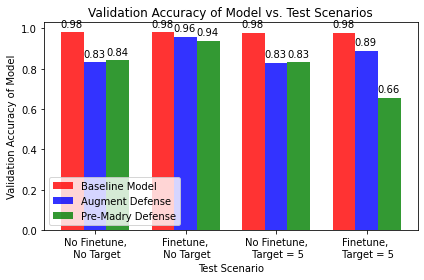

In [3]:
# data to plot
n_groups = 4
success_rate_Baseline = (0.9805, 0.9805, 0.9753, 0.9753)
success_rate_Augment = (0.8323, 0.9576, 0.8300, 0.8893)
success_rate_Madry = (0.8412, 0.9350, 0.8333, 0.6564)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.25
opacity = 0.8

rects1 = plt.bar(index, success_rate_Baseline, bar_width,
alpha=opacity,
color='r',
label='Baseline Model')

rects2 = plt.bar(index + bar_width, success_rate_Augment, bar_width,
alpha=opacity,
color='b',
label='Augment Defense')

rects3 = plt.bar(index + bar_width * 2, success_rate_Madry, bar_width,
alpha=opacity,
color='g',
label='Pre-Madry Defense')

plt.xlabel('Test Scenario')
plt.ylabel('Validation Accuracy of Model')
plt.title('Validation Accuracy of Model vs. Test Scenarios')
plt.xticks(index + bar_width, ('No Finetune,\n No Target', 'Finetune,\n No Target', 'No Finetune,\n Target = 5', 'Finetune, \n Target = 5'))
plt.legend(loc = 'lower left')

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = round(rect.get_height(), 2)
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 3, height),
                    xytext=(3, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.tight_layout()
plt.show()

Written Exercise 12

Modified Evaluate Defense to Evaluate on Mulitple Datasets

In [0]:
def evaluate_defense_exercise_12(
    X, Y, X_2, Y_2,
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=None,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.AugmentDefender,
    defender_params=dict(finetune=False, epochs=10),
    defend_params=dict(augment_ratio=1.0),
):

    m = model_class()
    m.load()
    
    att = attacker_class(
        model=m,
        **attack_params
    )

    X = X[0:sample_size]
    Y = Y[0:sample_size]
    X_2 = X_2[0:sample_size]
    Y_2 = Y_2[0:sample_size]
    print("=== before defense ===")
    
    # Check prediction performance before defense.
    pre_acc = {sname: (m.f_preds(s.X) == s.Y).mean()
               for sname, s in zip(["train", "test", "valid"], mnist_data)}
    print(pre_acc)
    
    pre_acc_2 = {sname_2: (m.f_preds(X_2) == Y_2).mean()
               for sname_2, s in zip(["train", "test", "valid"], mnist_data)}
    print(pre_acc_2)

    # Check adversarial success before defense.
    pre_s, pre_dist = att.evaluate(X=X, Y=Y)
    
    pre_s_2, pre_dist_2 = att.evaluate(X_2, Y_2)

    d = defender_class(
        attacker=att,
        model=m,
        **defender_params
    )
    
    d.defend(
        X, Y,
        **defend_params
    )
    
    att = attacker_class(
        model=d.model,
        **attack_params
    )

    print("=== after defense ===")
    # Check prediction performance after defense.
    post_acc = {sname: (m.f_preds(s.X) == s.Y).mean()
               for sname, s in zip(["train", "test", "valid"], mnist_data)}
    print(post_acc)
    
    post_acc_2 = {sname_2: (m.f_preds(X_2) == Y_2).mean()
               for sname_2, s_2 in zip(["train", "test", "valid"], mnist_data)}
    print(post_acc_2)

    # Check adversarial success after the defense.
    # Note that checking on the same set that we defended against
    # might not be a fair check for successful defense.
    post_s, post_dist = att.evaluate(X=X, Y=Y)
    post_s_2, post_dist_2 = att.evaluate(X_2, Y_2)


    plt.close('all')
    
    print("=== defense results ===")
    for sname in pre_acc.keys():
        pre = pre_acc[sname]
        post = post_acc[sname]
        print(f"{sname} acc:\t{pre:0.4f} -> {post:0.4f}\t({post-pre:0.4f} {100 * (post-pre)/pre:0.4f}% change)")
    
    print(f"adv success:\t{100*pre_s:0.4f}% -> {100*post_s:0.4f}%\t({post_s-pre_s:0.4f} {100 * (post_s-pre_s)/pre_s:0.4f}% change)")
    for pre_d, post_d, l in zip(pre_dist, post_dist, ["L0", "L1", "L2", "Linf"]):
        print(f"{l} distortion:\t{pre_d:0.4f} -> {post_d:0.4f}\t({post_d-pre_d:0.4f} {100 * (post_d-pre_d)/pre_d:0.4f}% change)")

    print("=== defense results ===")
    for sname_2 in pre_acc_2.keys():
        pre_2 = pre_acc_2[sname_2]
        post_2 = post_acc_2[sname_2]
        print(f"{sname_2} acc:\t{pre_2:0.4f} -> {post_2:0.4f}\t({post_2-pre_2:0.4f} {100 * (post_2-pre_2)/pre_2:0.4f}% change)")
    
    print(f"adv success:\t{100*pre_s_2:0.4f}% -> {100*post_s_2:0.4f}%\t({post_s_2-pre_s_2:0.4f} {100 * (post_s_2-pre_s_2)/pre_s_2:0.4f}% change)")
    for pre_d_2, post_d_2, l in zip(pre_dist_2, post_dist_2, ["L0", "L1", "L2", "Linf"]):
        print(f"{l} distortion:\t{pre_d_2:0.4f} -> {post_d_2:0.4f}\t({post_d_2-pre_d_2:0.4f} {100 * (post_d_2-pre_d_2)/pre_d_2:0.4f}% change)")



Generate Results for Different Distrubtions (only defended against one subset of data).

In [40]:
m._prepare_model()
evaluate_defense_exercise_12(
    X=mnist_data.valid.X[0:5000],
    Y=mnist_data.valid.Y[0:5000],
    X_2=mnist_data.valid.X[5000: -1],
    Y_2=mnist_data.valid.Y[5000: -1],
    model_class=hw4_mnist.MNISTModel, 
    attack_params=dict(
        num_steps=20,
        target=None,
        learning_rate=8.0,
        learning_rate_decay=0.9,
        k=0.0,
        c=4.0
    ),
    attacker_class=hw4_part1.CWL2Attacker,
    sample_size=256,
    defender_class=hw4_part2.AugmentDefender,
    defender_params=dict(finetune=False, epochs=10),
    defend_params=dict(augment_ratio=1.0),
)

Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 8s 155us/sample - loss: 0.2061 - acc: 0.9354 - val_loss: 0.0738 - val_acc: 0.9778
=== before defense ===
{'train': 0.97894, 'test': 0.9778, 'valid': 0.98}
{'train': 0.98828125, 'test': 0.98828125, 'valid': 0.98828125}
Target = None evaluation


Success rate:  0.91015625
Mean Distortion:  $L_0$=771.8970, $L_1$=33.3675, $L_2$=3.2685, $L_\infty$=0.9002
Target = None evaluation


Success rate:  0.890625
Mean Distortion:  $L_0$=773.4079, $L_1$=33.9874, $L_2$=3.2978, $L_\infty$=0.9210


Train on 512 samples
Epoch 1/10
512/512 [==============================] - 0s 331us/sample - loss: 2.2144 - acc: 0.2480
Epoch 2/10
512/512 [==============================] - 0s 133us/sample - loss: 1.7047 - acc: 0.5176
Epoch 3/10
512/512 [==============================] - 0s 133us/sample - loss: 1.0112 - acc: 0.6895
Epoch 4/10
512/512 [==============================] - 0s 143us/sample - loss: 0.6433 - acc: 0.7988
Epoch 5/10
512/512 [==============================] - 0s 138us/sample - loss: 0.4573 - acc: 0.8457
Epoch 6/10
512/512 [==============================] - 0s 144us/sample - loss: 0.3384 - acc: 0.9023
Epoch 7/10
512/512 [==============================] - 0s 139us/sample - loss: 0.2329 - acc: 0.9434
Epoch 8/10
512/512 [==============================] - 0s 134us/sample - loss: 0.1941 - acc: 0.9531
Epoch 9/10
512/512 [==============================] - 0s 132us/sample - loss: 0.1878 - acc: 0.9355
Epoch 10/10
512/512 [==============================] - 0s 139us/sample - loss: 0.1218 - 

Success rate:  0.828125
Mean Distortion:  $L_0$=776.6698, $L_1$=31.1600, $L_2$=2.6619, $L_\infty$=0.8680
Target = None evaluation


Success rate:  0.8359375
Mean Distortion:  $L_0$=765.2289, $L_1$=27.3301, $L_2$=2.2674, $L_\infty$=0.7263
=== defense results ===
train acc:	0.9789 -> 0.8159	(-0.1630 -16.6547% change)
test acc:	0.9778 -> 0.8428	(-0.1350 -13.8065% change)
valid acc:	0.9800 -> 0.8280	(-0.1520 -15.5102% change)
adv success:	91.0156% -> 82.8125%	(-0.0820 -9.0129% change)
L0 distortion:	771.8970 -> 776.6698	(4.7728 0.6183% change)
L1 distortion:	33.3675 -> 31.1600	(-2.2075 -6.6158% change)
L2 distortion:	3.2685 -> 2.6619	(-0.6066 -18.5580% change)
Linf distortion:	0.9002 -> 0.8680	(-0.0322 -3.5753% change)
=== defense results ===
train acc:	0.9883 -> 0.8750	(-0.1133 -11.4625% change)
test acc:	0.9883 -> 0.8750	(-0.1133 -11.4625% change)
valid acc:	0.9883 -> 0.8750	(-0.1133 -11.4625% change)
adv success:	89.0625% -> 83.5938%	(-0.0547 -6.1404% change)
L0 distortion:	773.4079 -> 765.2289	(-8.1790 -1.0575% change)
L1 distortion:	33.9874 -> 27.3301	(-6.6574 -19.5877% change)
L2 distortion:	3.2978 -> 2.2674	(-1.

Visualization Creation for Exercise 12

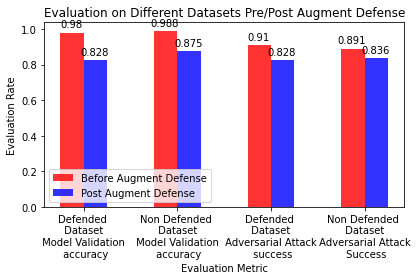

In [42]:
# data to plot
n_groups = 4
pre_values = (0.98, 0.98828125, 0.91015625, 0.890625)
post_values = (0.828, 0.875, 0.828125, 0.8359375)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.25
opacity = 0.8

rects1 = plt.bar(index, pre_values, bar_width,
alpha=opacity,
color='r',
label='Before Augment Defense')

rects2 = plt.bar(index + bar_width, post_values, bar_width,
alpha=opacity,
color='b',
label='Post Augment Defense')


plt.xlabel('Evaluation Metric')
plt.ylabel('Evaluation Rate')
plt.title('Evaluation on Different Datasets Pre/Post Augment Defense')
plt.xticks(index + bar_width/2, ('Defended \n Dataset \n Model Validation \n accuracy', 'Non Defended \n Dataset \n Model Validation \n accuracy', 'Defended \n Dataset \n Adversarial Attack \n success', 'Non Defended \n Dataset \n Adversarial Attack \n Success'))
plt.legend(loc = 'lower left')

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = round(rect.get_height(), 3)
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 3, height),
                    xytext=(3, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)


plt.tight_layout()
plt.show()

# PART 3

In [0]:
import hw4_part3
hw4_part3.tqdm = tqdm

In [0]:
def visualize_coeffs(
    rep
):
    # Visualize the bottom and top coefficients for each target class.
    
    train_X = rep.X
    train_Y = rep.Ytrue
    
    m = rep.model
    coeffs = rep.coeffs()
    preds = m.f_preds(train_X)
    
    for target_class in range(0,10):
        coeffs_target = coeffs[:, target_class]
    
        coeffs_sort = np.argsort(coeffs_target)

        top = coeffs_sort[len(coeffs_sort)-4: len(coeffs_sort)]
        bot = coeffs_sort[0: 4]
    
        fig, axs = plt.subplots(1,8, figsize=(16,3.5))
        fig.suptitle(f"bot/top coeffs for class {target_class} ($\\lambda$={m.lam})")
    
        for i, idx in enumerate([*bot, *top]):
            x = train_X[idx]
            y = train_Y[idx]
            pred = preds[idx]
        
            disp_coeff = len(train_X)*coeffs_target[idx]
        
            axs[i].imshow(x[:,:,0])
            axs[i].set_title(
                f"instance {idx}\nclass {y}, pred {pred}\n$n\\alpha$={disp_coeff:0.8f}"
            )
        
        display(fig)
        
    plt.close('all')

def visualize_similarity(
    rep,
    explain_X, explain_Y,
    iname
):
    # Visualize the bottom and top representer points for each instance in 
    # explain_X just based on their similarity.
    
    train_X = rep.X
    train_Y = rep.Ytrue
    
    sims = rep.similarity(explain_X)
    preds = m.f_preds(explain_X)
    
    for i, x, y, pred, sim in zip(range(len(explain_X)), explain_X, explain_Y, preds, sims):
        fig, axs = plt.subplots(1,7, figsize=(14,3.5))
        fig.suptitle(f"bot/top similarity to {iname} instance {i} ($\\lambda$={m.lam})")
        
        axs[3].imshow(x[:,:,0])
        axs[3].set_title(f"target\nclass {y}\npred {pred}")
        
        sim_sorted = np.argsort(sim)

        top = sim_sorted[len(sim_sorted)-4:len(sim_sorted)]
        bot = sim_sorted[0:4]

        for i in range(3):
            idx = bot[i]
            tx = train_X[idx]
            ty = train_Y[idx]
            axs[i].imshow(tx[:,:,0])
            axs[i].set_title(f"instance {idx}\nclass {ty}\n$f_i f_t$={sim[idx]:0.5f}")
        
        for i in range(3):
            idx = top[i]
            tx = train_X[idx]
            ty = train_Y[idx]
            axs[i+4].imshow(tx[:,:,0])
            axs[i+4].set_title(f"instance {idx}\nclass {ty}\n$f_i f_t$={sim[idx]:0.5f}")
        
        display(fig)
        
    plt.close('all')
        
def visualize_representers(
    rep,
    explain_X, explain_Y,
    iname,
):
    # Visualize the bottom and top representer points for each instance in explain_X.
    
    train_X = rep.X
    train_Y = rep.Ytrue
    
    _, vals = rep.coeffs_and_values(explain_X)
    preds = m.f_preds(explain_X)
    
    for i, x, y, pred, v in zip(range(len(explain_X)), explain_X, explain_Y, preds, vals):
        fig, axs = plt.subplots(1,7, figsize=(14,3.5))
        fig.suptitle(f"bot/top representers for {iname} instance {i} ($\\lambda$={m.lam})")
        
        axs[3].imshow(x[:,:,0])
        axs[3].set_title(f"target\nclass {y}\npred {pred}")
    
        vt = v[:, pred] # will visualize impact on predicted class only
          
        top = np.argsort(vt)[len(vt)-5:len(vt)]
        bot = np.argsort(vt)[0:5]

        for i in range(3):
            idx = bot[i]
            tx = train_X[idx]
            ty = train_Y[idx]
            disp_val = len(train_X)*vt[idx]
            axs[i].imshow(tx[:,:,0])
            axs[i].set_title(f"instance {idx}\nclass {ty}\n$nk$={disp_val:0.6f}")
        
        for i in range(3):
            idx = top[i]
            tx = train_X[idx]
            ty = train_Y[idx]
            disp_val = len(train_X)*vt[idx]
            axs[i+4].imshow(tx[:,:,0])
            axs[i+4].set_title(f"instance {idx}\nclass {ty}\n$nk$={disp_val:0.6f}")
        
        display(fig)
        
    plt.close('all')

In [3]:
m = hw4_part3.MNISTModelRegular()
m.load()
m._prepare_model() # retrain and save model



Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 14s 283us/sample - loss: 0.3893 - acc: 0.9252 - val_loss: 0.1422 - val_acc: 0.9711


In [0]:
r = hw4_part3.Representer(
    m,
    mnist_data.train.X,
    mnist_data.train.Y
)

Written Exercise 22

Updated Similarity Function to Show top ten for a target class

In [0]:
def visualize_similarity_top_only(
    rep,
    explain_X, explain_Y,
    iname
):
    # Visualize the bottom and top representer points for each instance in 
    # explain_X just based on their similarity.
    
    train_X = rep.X
    train_Y = rep.Ytrue
    
    sims = rep.similarity(explain_X)
    preds = m.f_preds(explain_X)
    ret_Y = []
    for i, x, y, pred, sim in zip(range(len(explain_X)), explain_X, explain_Y, preds, sims):
        # fig, axs = plt.subplots(1,10, figsize=(20,3.0))
        # fig.suptitle(f"top similarity to {iname} instance {i} ($\\lambda$={m.lam})")
        
        # axs[3].imshow(x[:,:,0])
        # axs[3].set_title(f"target\nclass {y}\npred {pred}")
        
        sim_sorted = np.argsort(sim)

        top = sim_sorted[len(sim_sorted)-10 :len(sim_sorted)]
        
        for i in range(len(top)):
            idx = top[i]
            tx = train_X[idx]
            ty = train_Y[idx]
            # axs[i].imshow(tx[:,:,0])
            # axs[i].set_title(f"instance {idx}\nclass {ty}\n$f_i f_t$={sim[idx]:0.5f}")
            ret_Y.append(ty)
        # display(fig)
    class_array = np.asarray(ret_Y).reshape((len(explain_X), 10))
    # plt.close('all')
    return class_array

In [0]:
def input_space_similarity_measure(X, whole_dataset):
    ret_Y = []
    for index in range(len(X)):
        x_image = X[index].ravel()
        x_image_norm = x_image/np.linalg.norm(x_image)
        x_rest = whole_dataset #np.delete(whole_dataset, index, 0)
        dot_list = [np.dot(x_image_norm, x_rest[i].ravel()/np.linalg.norm(x_rest[i].ravel())) for i in range(len(x_rest))]
        dot_array = np.array(dot_list)
        dot_sorted = np.argsort(dot_array)
        most_similar = dot_sorted[-11:-1]
        Y_labels = [mnist_data.train.Y[idx] for idx in most_similar]
        ret_Y.append(Y_labels)
    class_array = np.vstack(ret_Y)
    return class_array

In [0]:
def similarity_score(similarity_array, similarity_label):
    class_score = []
    for i in range(len(similarity_label)):
        score = 0
        for j in range(similarity_array.shape[1]):
            if similarity_array[i][j] == similarity_label[i]:
                score+=1
        class_score.append(score)
    return class_score

In [60]:
imgs_to_look_at = 15
offset = 105
m._prepare_model()
r = hw4_part3.Representer(
    m,
    mnist_data.train.X,
    mnist_data.train.Y
)
similarity_feature_space_22 = visualize_similarity_top_only(
    r,
    mnist_data.train.X[0 + offset:imgs_to_look_at + offset],
    mnist_data.train.Y[0 + offset:imgs_to_look_at + offset],
    iname="train"
)
input_space_similarity_22 = input_space_similarity_measure(mnist_data.train.X[0 + offset:imgs_to_look_at + offset], mnist_data.train.X)
print("Input Space Similarity: \n", input_space_similarity_22)
print("Feature Space Similarity: \n", similarity_feature_space_22)
print("Correct Class: \n", mnist_data.train.Y[0:imgs_to_look_at])

input_score_22 = similarity_score(input_space_similarity_22, mnist_data.train.Y[0 + offset:imgs_to_look_at + offset])
print("Input Space Correct #: \n", input_score_22)
feature_score_22 = similarity_score(similarity_feature_space_22, mnist_data.train.Y[0 + offset:imgs_to_look_at + offset])
print("Feature Space Correct # \n", feature_score_22)

input_score_22 = np.array(input_score_22)
input_final_score = np.mean(input_score_22/10) * 100
print("Input Final Percent: {}%".format(input_final_score))

feature_score_22 = np.array(feature_score_22)
feature_final_score = np.mean(feature_score_22/10) * 100
print("Feature Final Percent: {}%".format(feature_final_score))

Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 12s 247us/sample - loss: 0.3780 - acc: 0.9313 - val_loss: 0.1375 - val_acc: 0.9746
Input Space Similarity: 
 [[1 1 1 1 1 1 1 1 1 1]
 [6 6 6 6 6 6 5 6 6 6]
 [3 3 3 3 3 3 3 3 3 3]
 [0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2]
 [9 9 9 9 9 9 9 9 9 9]
 [3 3 3 3 3 3 3 3 3 3]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [4 4 4 4 4 4 4 4 4 4]
 [9 9 9 9 9 9 9 9 9 9]
 [2 2 2 2 2 2 2 2 2 2]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]
Feature Space Similarity: 
 [[1 1 1 1 1 1 1 1 1 4]
 [6 6 6 5 6 6 6 6 6 5]
 [3 3 3 3 3 3 3 3 3 3]
 [0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2]
 [9 9 9 9 9 9 9 9 9 9]
 [3 3 3 3 3 3 3 3 3 3]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [4 4 4 4 4 4 4 4 4 4]
 [9 9 9 9 9 9 9 9 9 9]
 [2 2 2 2 2 2 2 2 2 2]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]
Correct Class: 
 [5 0 4 1 9 2 1 3 1 4 3 5 3 6 1]
Input Space Correct #: 
 

Written Exercise 23

In [0]:
import hw4_part1
import hw4_part2
hw4_part1.tqdm = tqdm
hw4_part2.tqdm = tqdm

In [61]:
#m._prepare_model()
att = hw4_part1.CWL2Attacker(
    model=m,
    num_steps=20,
    target=None,
    learning_rate=1.5,
    learning_rate_decay=0.95,
    k=0.0,
    c=4.5
)
Xp = att.attack_batch(mnist_data.train.X[np.arange(0,16)], mnist_data.train.Y[np.arange(0, 16)])
adversarial_similarity_feature_space_23 = visualize_similarity_top_only(
    r,
    Xp[0:10],
    mnist_data.train.Y[0:10],
    iname="train"
)

adversarial_input_space_similarity_23 = input_space_similarity_measure(Xp[0:10], mnist_data.train.X)
print("Adversarial Input Space Similarity: \n", adversarial_input_space_similarity_23)
print("Adversarial Feature Space Similarity: \n", adversarial_similarity_feature_space_23)
print("Correct Class: \n", mnist_data.train.Y[0:10])

adversarial_input_score_23 = similarity_score(adversarial_input_space_similarity_23, mnist_data.train.Y[0:10])
print("Adversarial Input Space Correct #: \n", adversarial_input_score_23)
adversarial_feature_score_23 = similarity_score(adversarial_similarity_feature_space_23, mnist_data.train.Y[0:10])
print("Adversarial Feature Space Correct # \n", adversarial_feature_score_23)

adversarial_input_score_23 = np.array(adversarial_input_score_23)
adversarial_input_final_score = np.mean(adversarial_input_score_23/10) * 100
print("Adversarial Input Final Percent: {}%".format(adversarial_input_final_score))

adversarial_feature_score_23 = np.array(adversarial_feature_score_23)
adversarial_feature_final_score = np.mean(adversarial_feature_score_23/10) * 100
print("Adversarial Feature Final Percent: {}%".format(adversarial_feature_final_score))

Adversarial Input Space Similarity: 
 [[5 5 5 3 5 3 3 3 3 5]
 [0 0 0 0 0 0 0 0 0 0]
 [4 4 4 4 4 4 4 4 4 4]
 [1 1 1 1 1 1 1 1 1 1]
 [9 9 9 9 9 9 9 9 9 9]
 [2 2 2 2 2 2 2 2 2 2]
 [1 1 1 1 1 1 1 1 1 1]
 [3 3 3 3 3 3 3 3 3 3]
 [1 1 1 1 1 1 1 1 1 1]
 [4 4 4 4 4 4 4 4 4 4]]
Adversarial Feature Space Similarity: 
 [[5 5 3 5 5 5 3 5 5 5]
 [0 0 0 0 0 2 2 0 0 0]
 [2 2 2 7 7 7 4 2 2 7]
 [4 4 4 4 4 4 4 4 4 4]
 [7 7 7 7 7 7 9 7 7 7]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [4 4 4 4 4 4 4 4 4 4]
 [4 4 4 4 4 4 4 4 4 4]]
Correct Class: 
 [5 0 4 1 9 2 1 3 1 4]
Adversarial Input Space Correct #: 
 [5, 10, 10, 10, 10, 10, 10, 10, 10, 10]
Adversarial Feature Space Correct # 
 [8, 8, 1, 0, 1, 10, 0, 0, 0, 10]
Adversarial Input Final Percent: 95.0%
Adversarial Feature Final Percent: 38.0%


Written Exercise 24

In [36]:
m._prepare_model()
r = hw4_part3.Representer(
    m,
    mnist_data.train.X,
    mnist_data.train.Y
)
att = hw4_part1.CWL2Attacker(
    model=m,
    num_steps=20,
    target=None,
    learning_rate=1.5,
    learning_rate_decay=0.95,
    k=0.0,
    c=4.5
)
Xp_defended = att.attack_batch(mnist_data.train.X[np.arange(0,16)], mnist_data.train.Y[np.arange(0, 16)])
defender_params=dict(finetune=False, epochs=10)
defend_params=dict(augment_ratio=1.0)
defender_class=hw4_part2.AugmentDefender
d = defender_class(
        attacker=att,
        model=m,
        **defender_params
    )
    
d.defend(
    Xp_defended, mnist_data.train.Y[0:16],
    **defend_params
    )
Xp_not_defended = att.attack(mnist_data.train.X[np.arange(16, 32)], mnist_data.train.Y[np.arange(16, 32)])
Xp_total = np.vstack((Xp_defended, Xp_not_defended[0:8]))
print(Xp_total.shape)

Train on 50000 samples, validate on 10000 samples
50000/50000 [==============================] - 9s 184us/sample - loss: 0.3982 - acc: 0.9250 - val_loss: 0.1442 - val_acc: 0.9708


Train on 32 samples
Epoch 1/10
32/32 [==============================] - 0s 6ms/sample - loss: 4.0842 - acc: 0.2500
Epoch 2/10
32/32 [==============================] - 0s 249us/sample - loss: 3.9646 - acc: 0.4688
Epoch 3/10
32/32 [==============================] - 0s 192us/sample - loss: 3.8568 - acc: 0.4688
Epoch 4/10
32/32 [==============================] - 0s 205us/sample - loss: 3.7632 - acc: 0.4688
Epoch 5/10
32/32 [==============================] - 0s 226us/sample - loss: 3.6697 - acc: 0.4375
Epoch 6/10
32/32 [==============================] - 0s 203us/sample - loss: 3.5800 - acc: 0.4062
Epoch 7/10
32/32 [==============================] - 0s 184us/sample - loss: 3.4957 - acc: 0.4688
Epoch 8/10
32/32 [==============================] - 0s 192us/sample - loss: 3.4061 - acc: 0.4688
Epoch 9/10
32/32 [==============================] - 0s 238us/sample - loss: 3.3176 - acc: 0.4688
Epoch 10/10
32/32 [==============================] - 0s 202us/sample - loss: 3.2253 - acc: 0.4688


(24, 28, 28, 1)


In [0]:
sims = r.similarity(Xp_total)

[1 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 1 1 0 0 0 1 0 0]


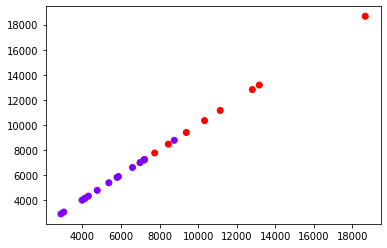

In [55]:
from sklearn.cluster import KMeans
k = KMeans(n_clusters=2)
y = k.fit_predict(sims)
plt.scatter(sims[:, 0], sims[:, 0], c=y, cmap="rainbow")
plt.show()

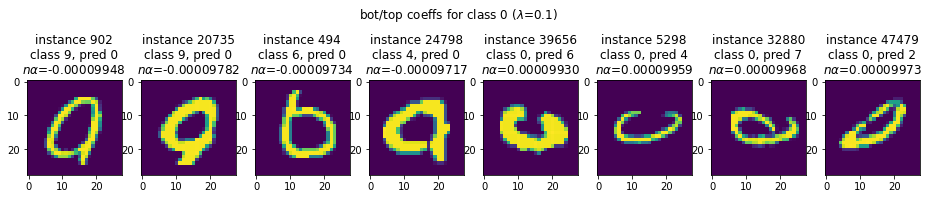

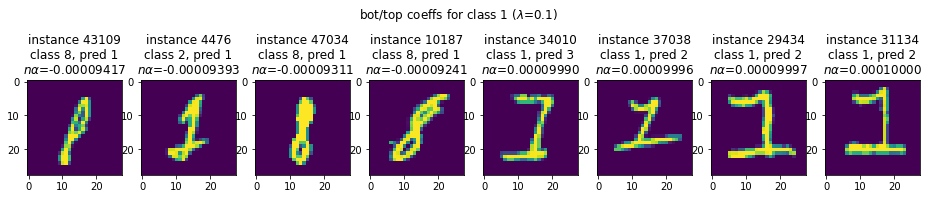

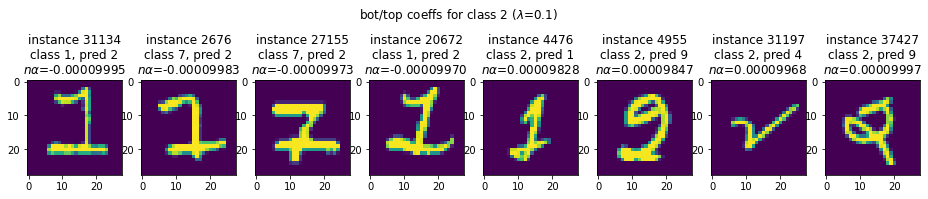

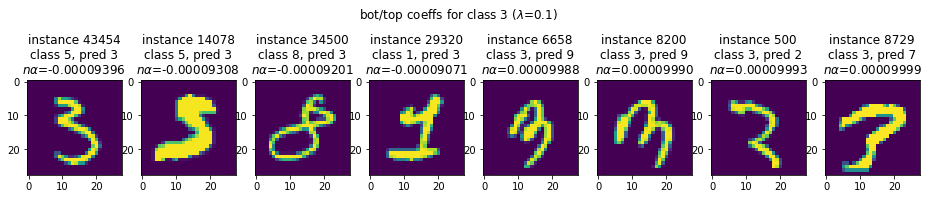

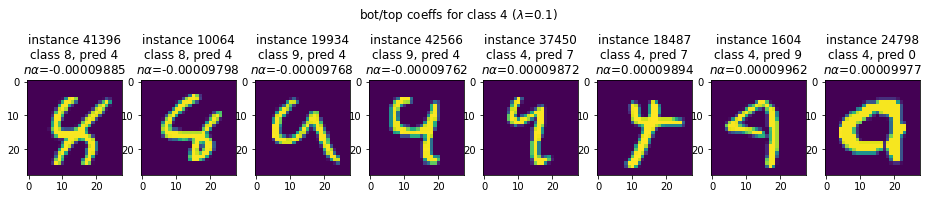

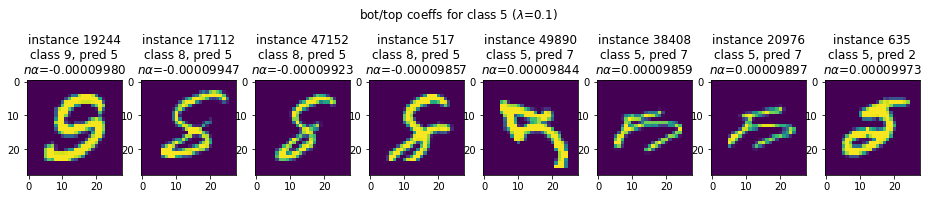

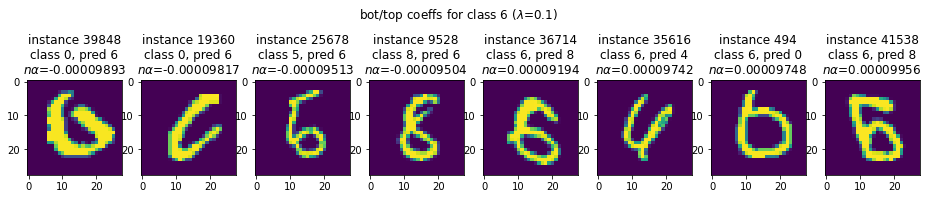

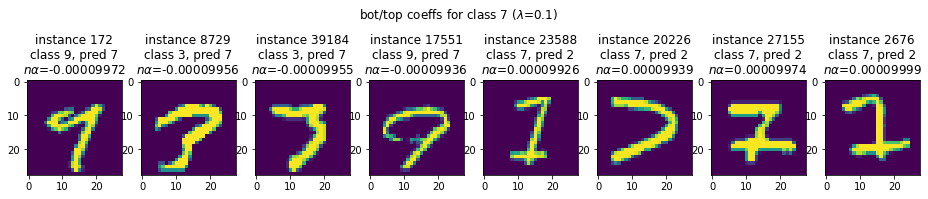

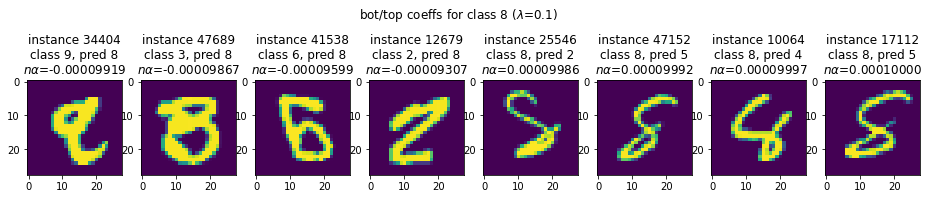

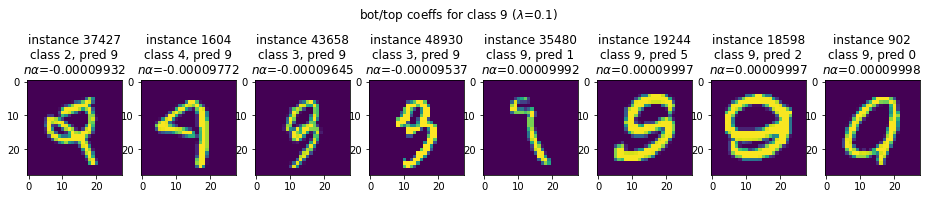

In [0]:
visualize_coeffs(r)

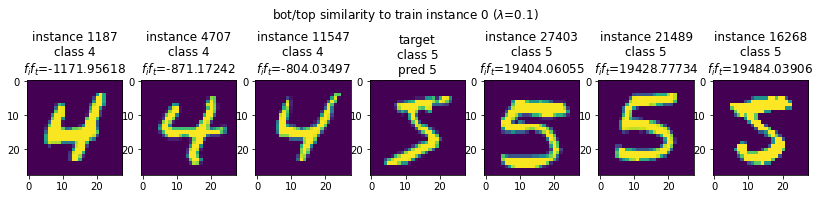

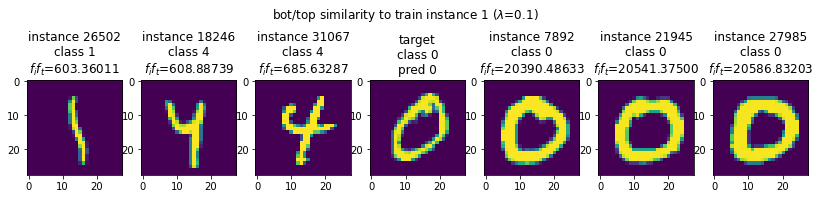

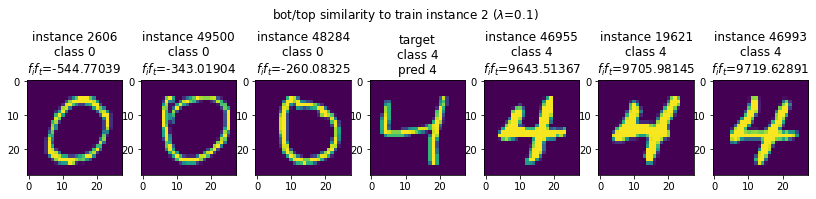

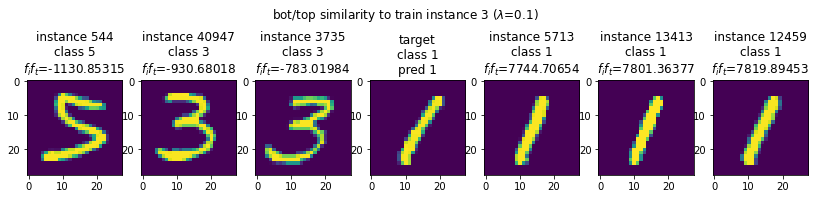

In [0]:
visualize_similarity(
    r,
    mnist_data.train.X[0:4],
    mnist_data.train.Y[0:4],
    iname="train"
)

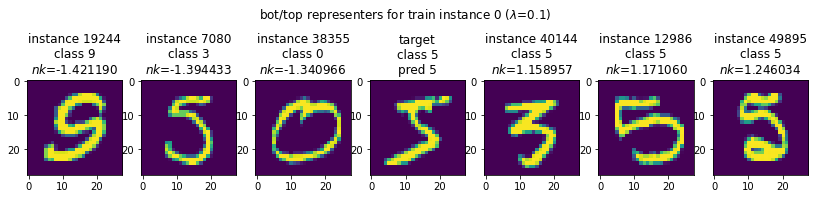

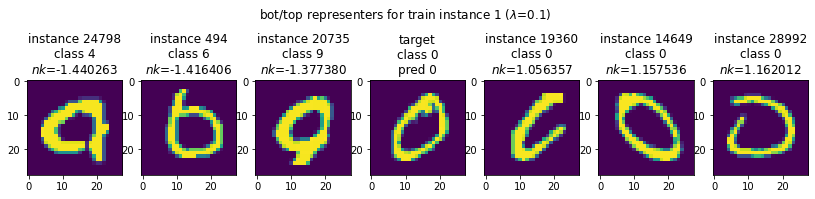

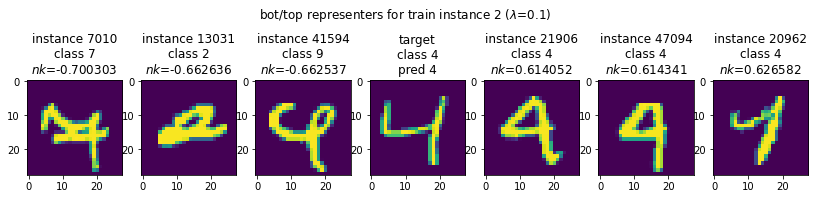

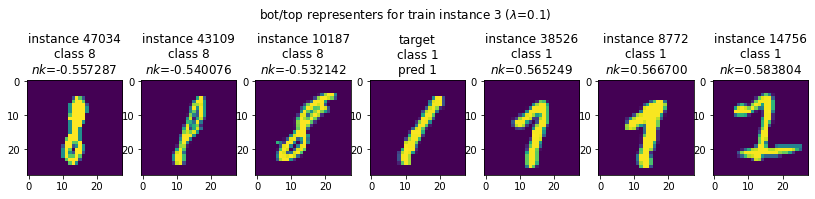

In [0]:
visualize_representers(
    r,
    mnist_data.train.X[0:4],
    mnist_data.train.Y[0:4],
    iname="train"
)